# Web Traffic Time Series Forecasting

* [Initialization](#initialization)
* [Plotting the Dataset](#plotting)
* [Forecasting](#forecasting)
    * [ARIMA Model](#arima)
    * [Recurrent Neural Network (RNN) - LSTM](#rnn)
    * [Facebook Prophet](#prophet)
* [Comparison of Models](#comparison)

<a id='initialization'></a>
### Initialization

In [24]:
# Always run this cell before using this notebook.

import pandas as pd
import numpy as np
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

# COMMON FUNCTIONS

def get_df():
    """
    Returns the dataset as a dataframe.
    The dataset contains the daily visitor counts of 15 English Wikipedia
    articles from 01-01-2017 to 31-12-2022. Index contains article names,
    and each column contains the visitor count of a particular date.
    """
    df = pd.read_csv('data\data.csv', index_col = 'article')
    df.columns = pd.to_datetime(df.columns, format='%Y-%m-%d')
    return df


def get_stacked_df():
    """
    Returns the dataset as a stacked dataframe.
    Stacked Dataframe has a MultiIndex [article, date].
    """
    df = pd.DataFrame(get_df().stack())
    idx = df.index
    idx.set_names(['article', 'date'], inplace=True)
    df.rename(columns = {0: 'visitors'}, inplace=True)
    return df


def get_article_list():
    """
    Returns a list of article names.
    """
    articles = get_df().index.tolist()
    return articles


def plot_results(predictions_df):
    """
    Plots Predictions vs Actual values for a given model.
    """
    for i in articles:
        df = data.loc[i]
        result_df = pd.DataFrame(df[-90:])
        result_df['predicted'] = predictions_df.loc[i]
        result_df.rename(columns = {'visitors': 'actual'}, inplace = True)
        result_df.plot(title = "article: '" + i + "'", figsize = (12, 4))


# Calculate MAE, RMSE, and MAPE
def evaluate_results(predictions_df):
    """
    Returns a dataframe containing the MAE, RMSE, and MAPE for each article 
    for a given model.
    """
    import math
    from sklearn.metrics import mean_absolute_error as mae
    from sklearn.metrics import mean_squared_error as mse
    from sklearn.metrics import mean_absolute_percentage_error as mape
    errors_df = pd.DataFrame(columns = ['mae', 'rmse', 'mape'])
    articles = get_article_list()
    for i in articles:
        df = data.loc[i].iloc[-90:]
        result = predictions_df.loc[i]
        errors_df.loc[i, 'mae'] = mae(df, result)
        errors_df.loc[i, 'rmse'] = math.sqrt(mse(df, result))
        errors_df.loc[i, 'mape'] = mape(df, result)
    return errors_df

# Common variables are initialized here.
articles = get_article_list()
data = get_stacked_df()

<a id='plotting'></a>
### Plotting the Dataset

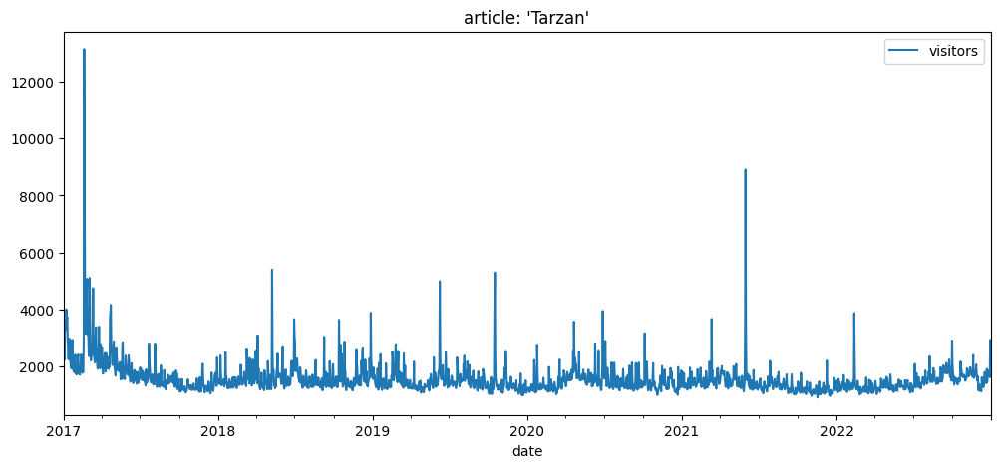

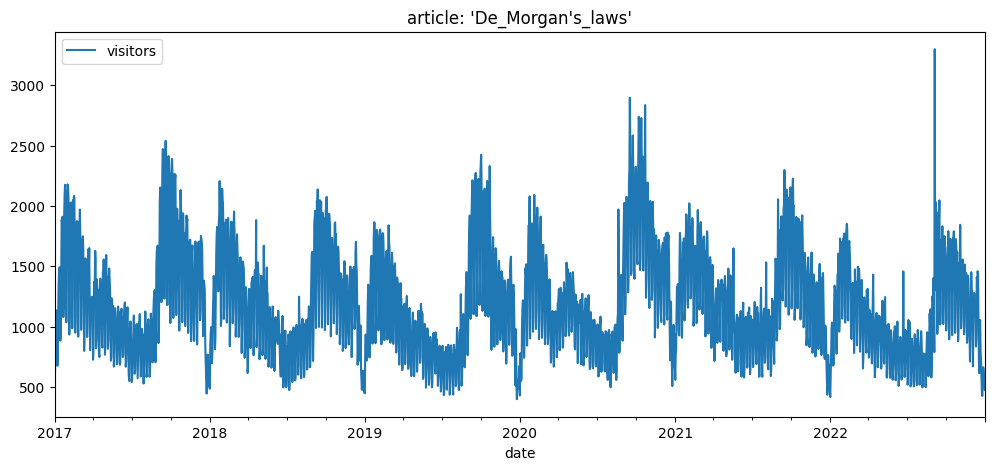

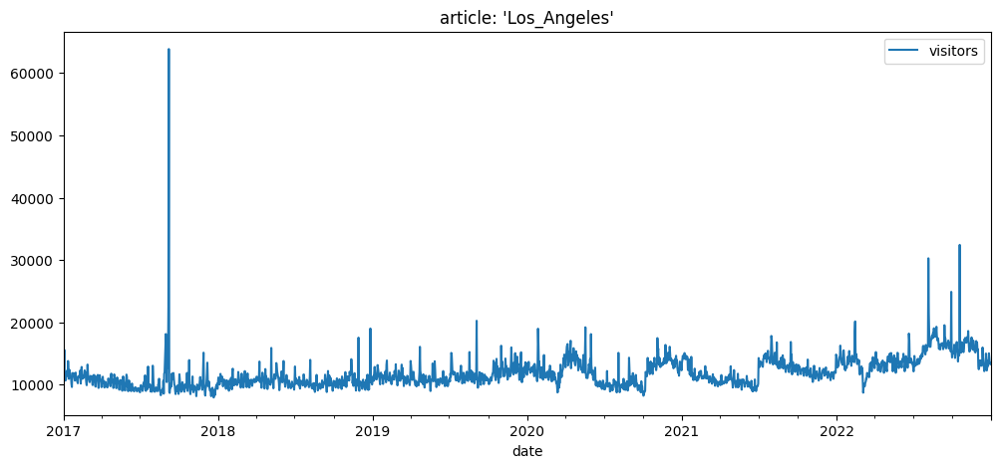

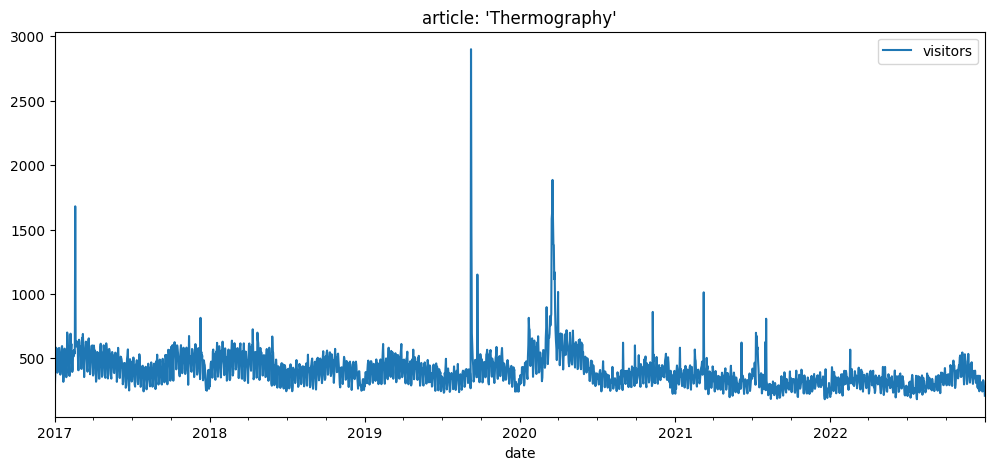

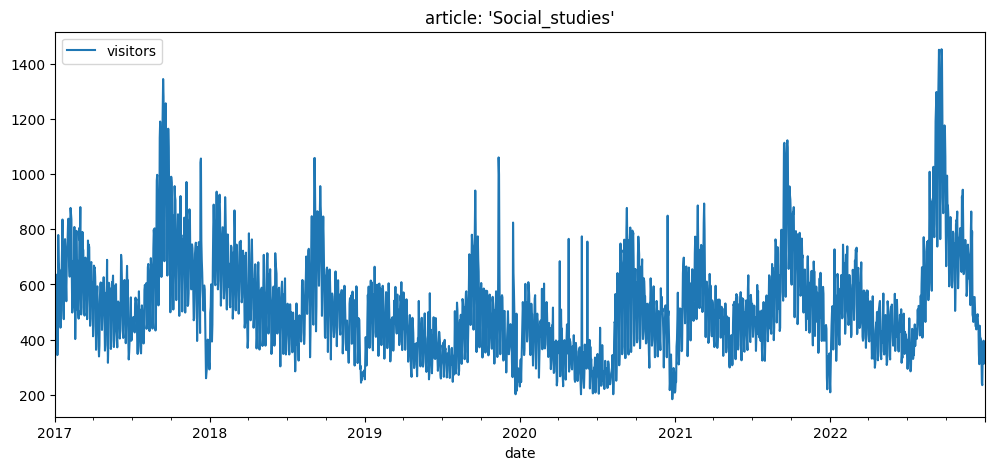

...

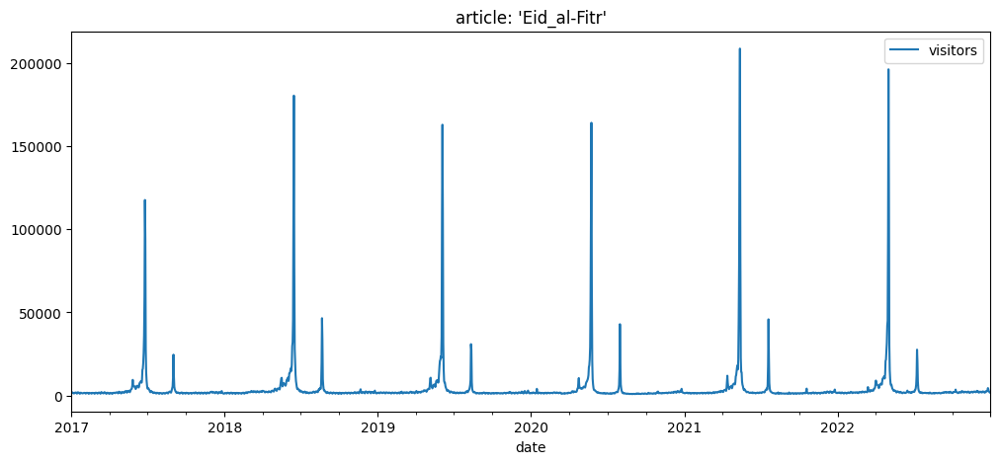

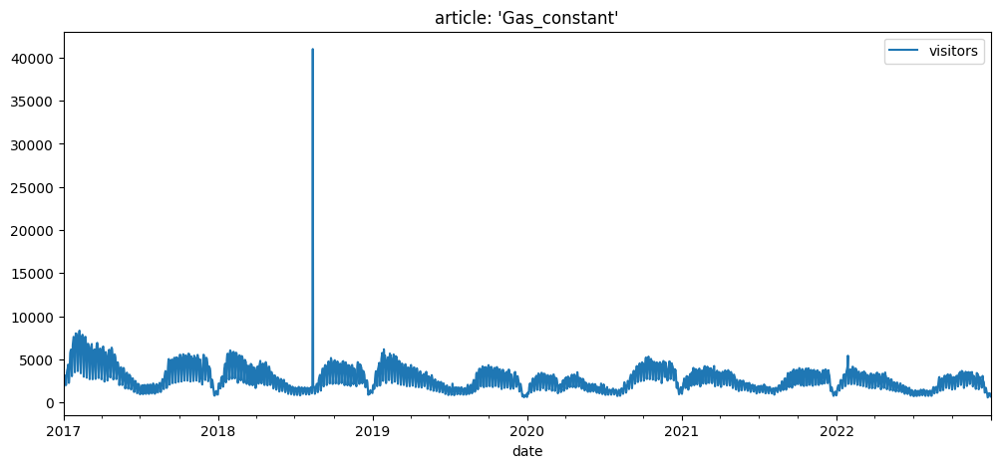

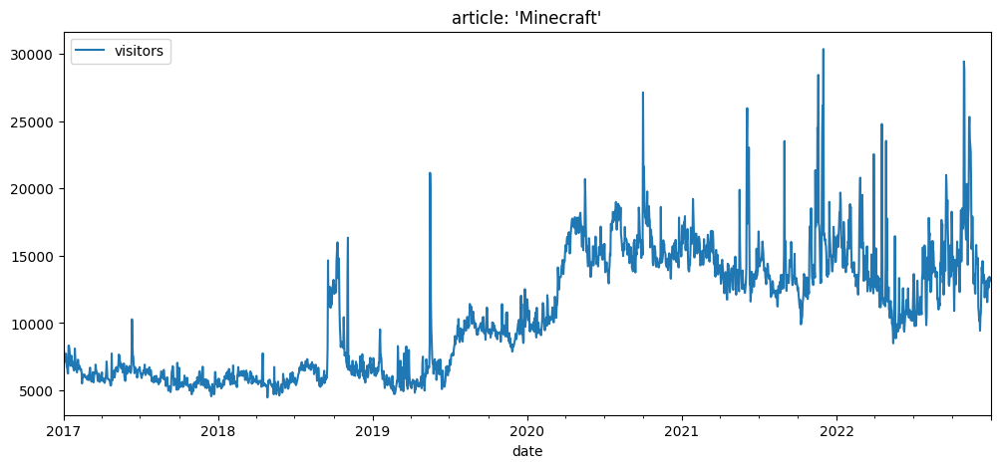

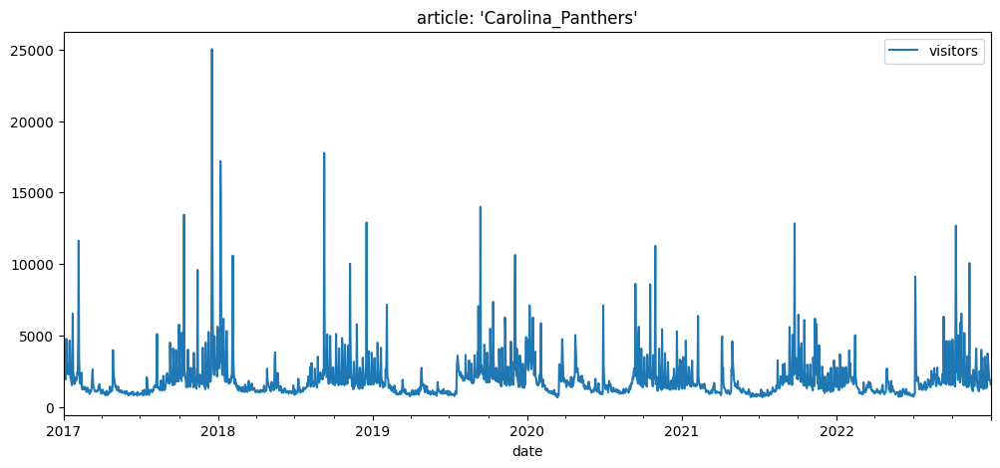

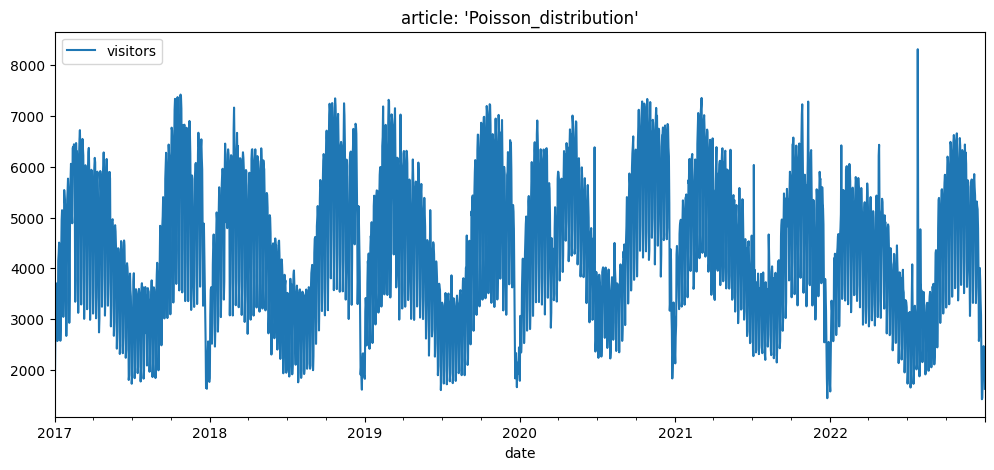

In [25]:
for i in articles:
    data.loc[i].plot(title="article: '" + i + "'", figsize=(12, 5))

<a id='forecasting'></a>
### Forecasting

<a id='arima'></a>
### ARIMA Model

* ARIMA, short for **'Auto Regressive Integrated Moving Average'** is a model that predicts the future values of a given time series based on its own past values, i.e., its own lags and the lagged forecast errors.
* Any 'non-seasonal' time series that exhibits patterns and is not a random white noise can be modeled with ARIMA models.
* The ARIMA model consists of three main components:
    1. **Autoregression (AR)**: This refers to the use of past values of the time series to predict future values. In other words, the model looks at how the time series has behaved in the past to predict how it will behave in the future.
    2. **Moving Average (MA)**: This component takes into account the errors or "residuals" of the predictions made by the AR component. It uses past errors to adjust the forecast for future values.
    3. **Integrated (I)**: This component refers to the process of differencing the time series to make it stationary. A stationary time series has a constant mean and variance over time. This is important because it allows for more accurate predictions.
* ARIMA model is characterized by 3 terms: p, d, q, where
    * p is the order (no. of lags) of the AR model.
    * q is the order of the MA model.
    * d is the number of differencing required to make the time series stationary.

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#### ADF Test
* **Augmented Dickey Fuller test (ADF Test)** is a common statistical test used to test whether a given time series is stationary or not.
* A stationary time series has a constant mean, constant variance, and no trend or seasonality over time.
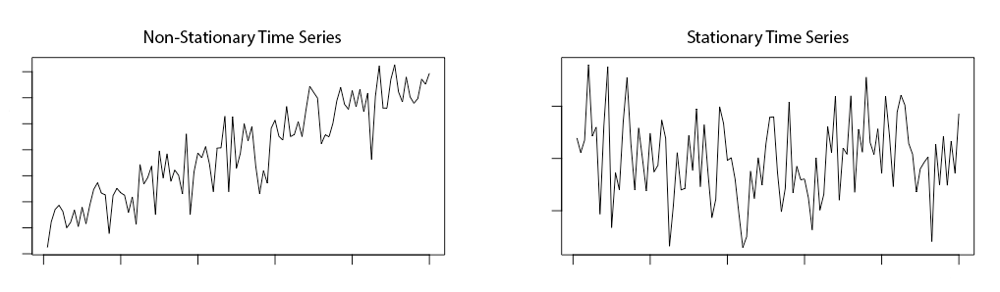
* The ADF test is a statistical significance test, which means it involves a hypothesis test with a null and alternate hypothesis.
* Unit root is a characteristic of a time series that makes it non-stationary.
* The null hypothesis states that if a unit root is present in a time series, then the series is non-stationary.
* The test computes some test statistics such as the p-value, no. of lags, critical value cut-offs etc.
* If the p-value is less than the significance level (0.05), we reject the null hypothesis, which means the time series is stationary.
* On the other hand, if the null hypothesis cannot be rejected, then it can be concluded that the time series is non-stationary and may need to be transformed or differenced to become stationary.

In [27]:
from statsmodels.tsa.stattools import adfuller

# p-value > 0.05 : It is non stationary
# p-value <= 0.05: It is stationary

def adfuller_test(data):
    result = adfuller(data)
    print('ADF\t\t\t:', result[0])
    print('P-value\t\t\t: ', result[1])
    print('No. of Lags\t\t: ', result[2])
    print('No. of observations\t: ', result[3])
    print('Critical Values\t: ')
    for key, val in result[4].items():
        print('\t', key, '\t:', val)
    print()
    if result[1] <= 0.05:
        print("P-value <= 0.05")
        print("Data is stationary")
    else:
        print("P-value > 0.05")
        print("Data is not stationary")
    print('=================================================\n\n')

In [28]:
for i in articles:
    df = data.loc[i]
    print(i + '\n')
    adfuller_test(df)

Tarzan

ADF			: -5.503433157912452
P-value			:  2.046876195124273e-06
No. of Lags		:  21
No. of observations	:  2169
Critical Values	: 
	 1% 	: -3.4333684674663467
	 5% 	: -2.8628734534635902
	 10% 	: -2.5674798640234444

P-value <= 0.05
Data is stationary


De_Morgan's_laws

ADF			: -5.334945605233094
P-value			:  4.6330886522202325e-06
No. of Lags		:  21
No. of observations	:  2169
Critical Values	: 
	 1% 	: -3.4333684674663467
	 5% 	: -2.8628734534635902
	 10% 	: -2.5674798640234444

P-value <= 0.05
Data is stationary


Los_Angeles

ADF			: -4.2354101935339825
P-value			:  0.0005736314260138122
No. of Lags		:  12
No. of observations	:  2178
Critical Values	: 
	 1% 	: -3.433355979713365
	 5% 	: -2.8628679395895342
	 10% 	: -2.5674769282439556

P-value <= 0.05
Data is stationary


Thermography

ADF			: -4.361940242520014
P-value			:  0.000346413198129248
No. of Lags		:  26
No. of observations	:  2164
Critical Values	: 
	 1% 	: -3.4333754500434264
	 5% 	: -2.862876536558312
	 10% 	: -2

In [29]:
# Differencing to make data stationary

#df = data.loc[articles[0]]
#temp = df.copy()
#temp['visitors'] = df['visitors'] - df['visitors'].shift(1)
#temp.dropna(inplace = True)
#temp

#### Autocorrelation and Partial Autocorrelation
* **Autocorrelation (ACF)** is a measure of the correlation between a time series and a lagged version of itself.
* It measures how closely related a data point is to previous data points in the same series.
* It can help identify repeating patterns, trends, and seasonality in a time series.
<br><br>
* **Partial autocorrelation (PACF)**, on the other hand, measures the correlation between a data point and a lagged version of itself while controlling for the effect of other data points in between.
* It measures the unique relationship between two data points that is not explained by any intervening data points.
* It is useful for identifying the order of an autoregressive (AR) model.

In [30]:
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf

def plot_corr(df, title):
    fig = plt.figure(figsize=(12,3))
    fig.suptitle(title, fontsize=16)
    ax1 = fig.add_subplot(121)
    fig = plot_acf(df['visitors'], lags=40, ax=ax1)
    ax2 = fig.add_subplot(122)
    fig = plot_pacf(df['visitors'], lags=40, ax=ax2)

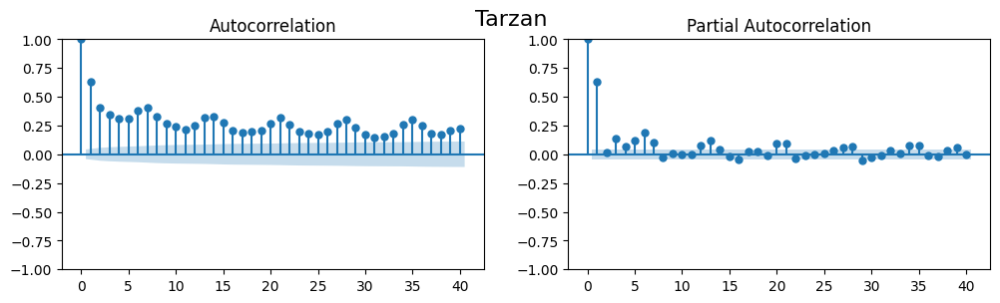

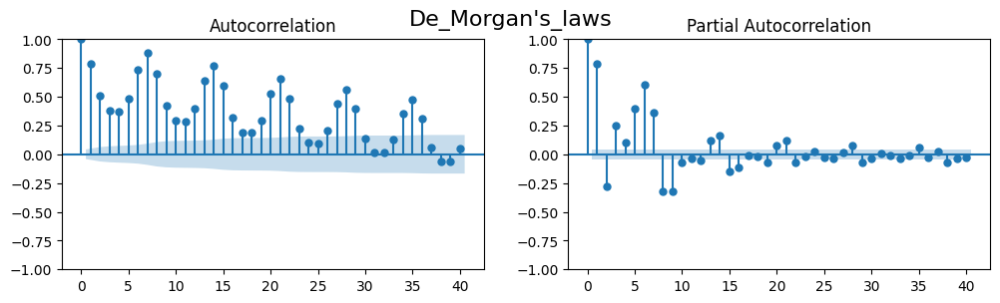

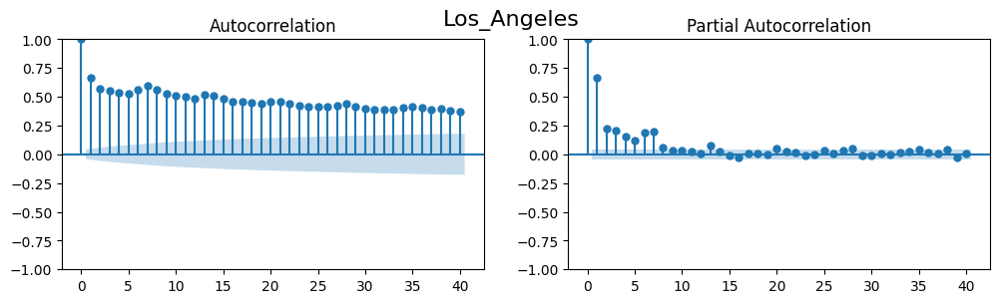

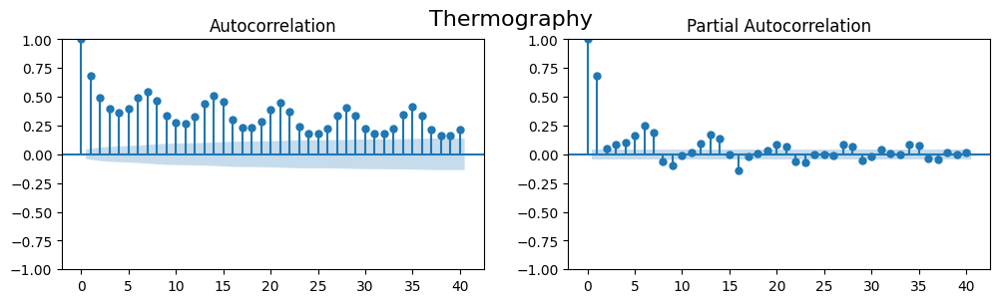

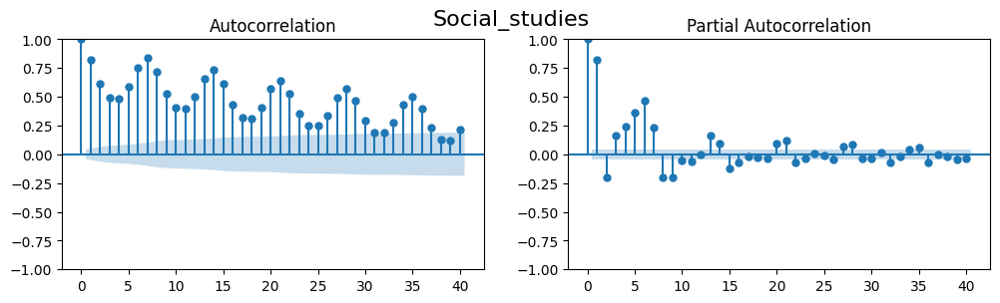

...

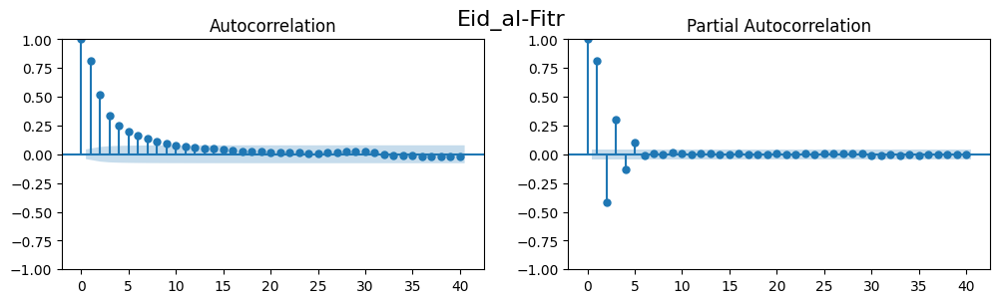

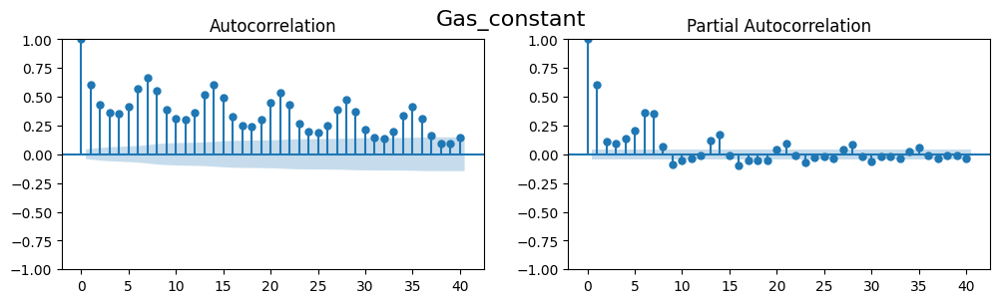

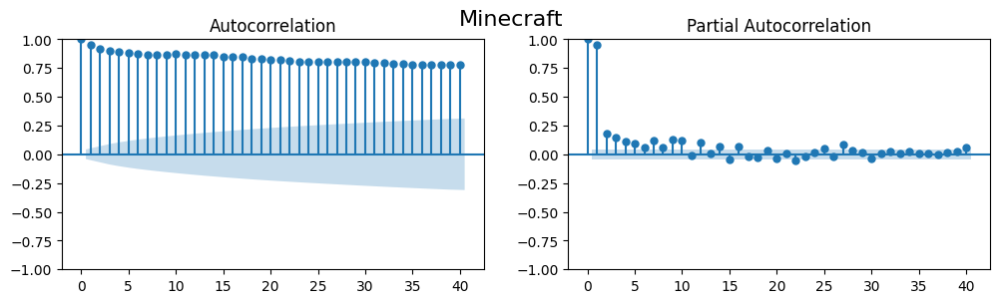

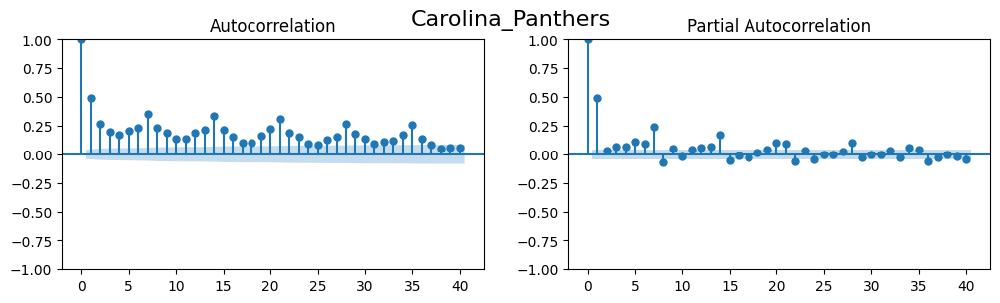

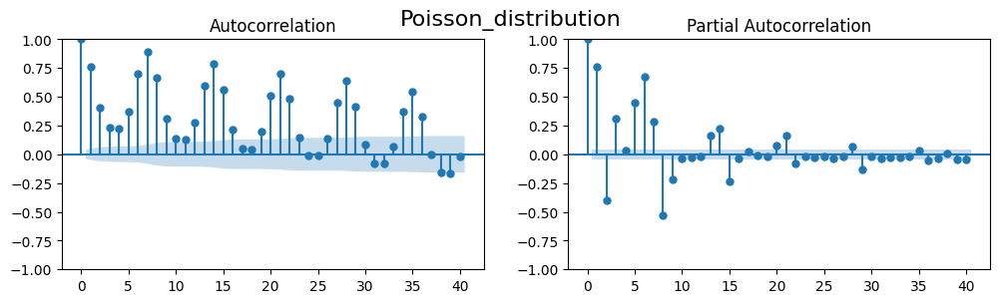

In [31]:
for i in articles:
    df = data.loc[i]
    plot_corr(df, i)

In [32]:
# pmdarima.auto_arima can be used to automatically find the optimal order for an ARIMA model.

from pmdarima import auto_arima

In [33]:
# The optimal order for each article is stored in 'params' as a key-value pair,
# where key is the article title and value is the order of ARIMA model.

params = {}
for i in articles:
    df = data.loc[i]
    print('Article: ' + i + '\n')
    stepwise_fit = auto_arima(df['visitors'], trace = True, suppress_warnings = True)
    params[i] = stepwise_fit.order
    print("===================================================================")

Article: Tarzan

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=32829.637, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=33433.489, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=33342.971, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=33182.473, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=33431.493, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=32828.899, Time=0.67 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=32859.240, Time=0.38 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=32843.876, Time=0.40 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=32829.687, Time=0.99 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=32835.631, Time=0.72 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=32831.115, Time=0.57 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=32831.639, Time=1.17 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=32827.512, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=32857.479, Time=0.19 sec
 A

 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=25999.073, Time=0.52 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=25417.060, Time=1.09 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=25855.965, Time=0.59 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=25166.312, Time=1.50 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=25646.370, Time=0.66 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=25141.308, Time=1.67 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=25399.024, Time=0.80 sec
 ARIMA(5,1,3)(0,0,0)[0] intercept   : AIC=25415.349, Time=2.09 sec
 ARIMA(4,1,3)(0,0,0)[0] intercept   : AIC=25174.259, Time=1.88 sec
 ARIMA(5,1,2)(0,0,0)[0]             : AIC=25139.404, Time=1.13 sec
 ARIMA(4,1,2)(0,0,0)[0]             : AIC=25166.433, Time=0.95 sec
 ARIMA(5,1,1)(0,0,0)[0]             : AIC=25397.033, Time=0.55 sec
 ARIMA(5,1,3)(0,0,0)[0]             : AIC=25424.115, Time=1.45 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=25644.364, Time=0.44 sec
 ARIMA(4,1,3)(0,0,0)[0]             : AIC=25226.602, Time=1.15

 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=29593.595, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=29595.247, Time=0.55 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=29592.081, Time=0.75 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=29592.078, Time=0.78 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=29605.342, Time=0.29 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=29586.462, Time=0.83 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=29604.478, Time=0.13 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=29596.318, Time=0.40 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=29619.046, Time=0.13 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=29594.634, Time=0.16 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept   : AIC=29589.591, Time=1.58 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=29584.505, Time=0.50 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=29602.459, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=29591.611, Time=0.16 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=29590.119, Time=0.36

 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=36164.606, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=43263.485, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=35626.569, Time=0.44 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=35663.587, Time=0.26 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=35538.146, Time=1.08 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=35965.669, Time=0.99 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=35598.294, Time=0.08 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=35433.688, Time=0.63 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=35524.521, Time=0.63 sec
 ARIMA(1,0,4)(0,0,0)[0] intercept   : AIC=35438.354, Time=0.86 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=35541.172, Time=0.36 sec
 ARIMA(0,0,4)(0,0,0)[0] intercept   : AIC=35519.887, Time=0.69 sec
 ARIMA(2,0,4)(0,0,0)[0] intercept   : AIC=35208.384, Time=1.39 sec
 ARIMA(3,0,4)(0,0,0)[0] intercept   : AIC=34619.108, Time=1.82 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=34620.007, Time=1.19

In [34]:
params

{'Tarzan': (4, 1, 3),
 "De_Morgan's_laws": (5, 0, 5),
 'Los_Angeles': (5, 1, 5),
 'Thermography': (4, 1, 3),
 'Social_studies': (5, 1, 2),
 'Normal_distribution': (2, 1, 3),
 'Buddhism': (5, 1, 3),
 'Adobe_Photoshop': (4, 1, 5),
 'Viscosity': (2, 1, 3),
 'Ferrero_Rocher': (1, 1, 3),
 'Eid_al-Fitr': (2, 0, 3),
 'Gas_constant': (5, 1, 5),
 'Minecraft': (1, 1, 1),
 'Carolina_Panthers': (3, 0, 5),
 'Poisson_distribution': (5, 0, 2)}

In [35]:
# Model fitting and forecasting

from statsmodels.tsa.arima.model import ARIMA

predictions_arima = pd.DataFrame(columns = df.index[-90:])

for i in articles:
    df = data.loc[i]
    train = df.iloc[:-90]
    test = df.iloc[-90:]
    p, d, q = params[i]
    
    model = ARIMA(train['visitors'], order = (p, d, q))
    model = model.fit()
    
    start = len(train)
    end = len(train) + len(test) - 1
    pred = model.predict(start = start, end = end, typ = 'levels')
    
    predictions_arima.loc[i] = pred.values

In [36]:
for col in predictions_arima.columns:
    predictions_arima[col] = predictions_arima[col].astype('int')
predictions_arima.index.rename('article', inplace = True)
predictions_arima.to_csv('predictions\predictions_arima.csv')

# Predictions using ARIMA model
predictions_arima

date,2022-10-03,2022-10-04,2022-10-05,2022-10-06,2022-10-07,2022-10-08,2022-10-09,2022-10-10,2022-10-11,2022-10-12,...,2022-12-22,2022-12-23,2022-12-24,2022-12-25,2022-12-26,2022-12-27,2022-12-28,2022-12-29,2022-12-30,2022-12-31
article,,,,,,,,,,,,,,,,,,,,,
Tarzan,1821,1850,1779,1692,1781,1827,1720,1723,1827,1779,...,1731,1769,1796,1747,1742,1793,1775,1733,1769,1794
De_Morgan's_laws,1500,1615,1675,1654,1264,912,1114,1493,1612,1670,...,1554,1196,899,1074,1430,1582,1624,1546,1191,899
Los_Angeles,16323,16373,16701,16873,16433,16265,16631,16672,16486,16724,...,16721,16517,16422,16544,16597,16590,16695,16713,16521,16430
Thermography,328,356,368,352,321,299,302,327,357,367,...,349,322,303,305,328,354,363,349,322,303
Social_studies,1052,1178,1161,997,797,723,833,1038,1181,1158,...,954,827,802,897,1039,1121,1082,952,830,808
Normal_distribution,7263,8638,8595,7372,6021,5535,6137,7236,7968,7859,...,6946,6945,6946,6949,6951,6950,6948,6947,6946,6947
Buddhism,7260,7395,7314,7080,6852,6840,7058,7341,7481,7376,...,7101,6941,6947,7113,7312,7395,7301,7101,6947,6954
Adobe_Photoshop,4148,4640,4550,4305,4055,3651,3581,4146,4630,4553,...,4346,4004,3655,3665,4129,4548,4574,4347,4001,3656
Viscosity,2774,3197,3249,2893,2395,2132,2300,2774,3196,3248,...,2888,2402,2145,2310,2772,3184,3236,2888,2403,2146


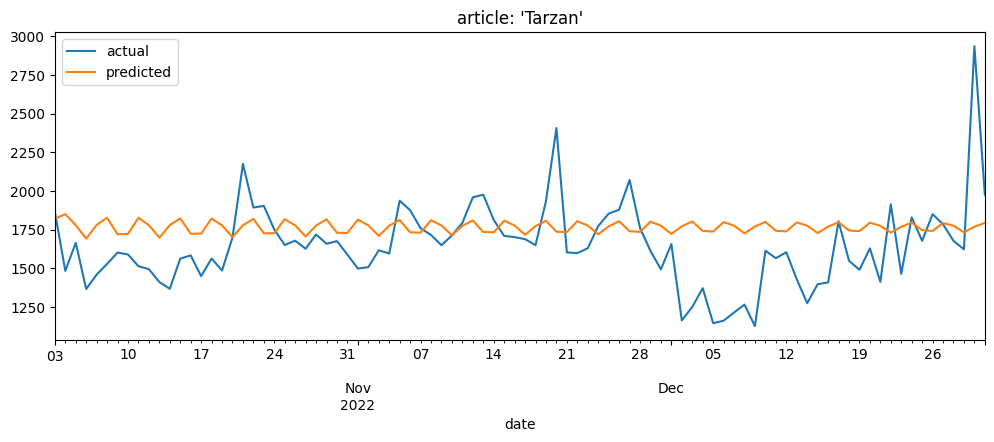

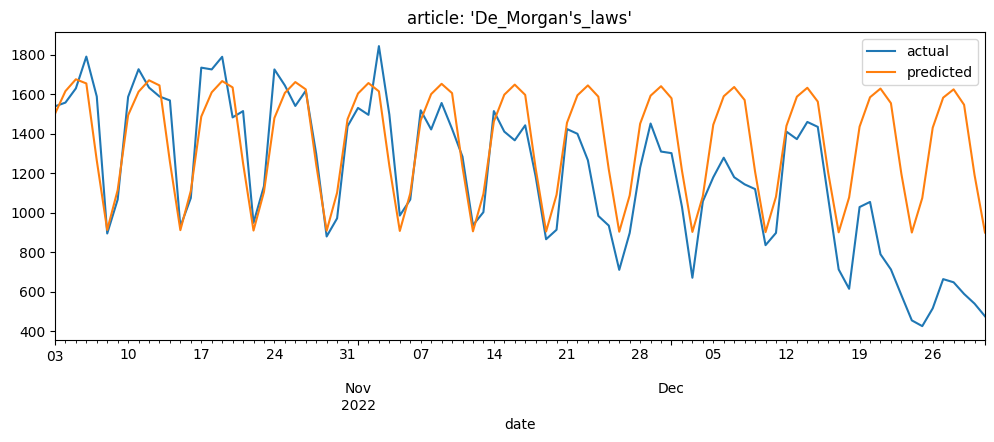

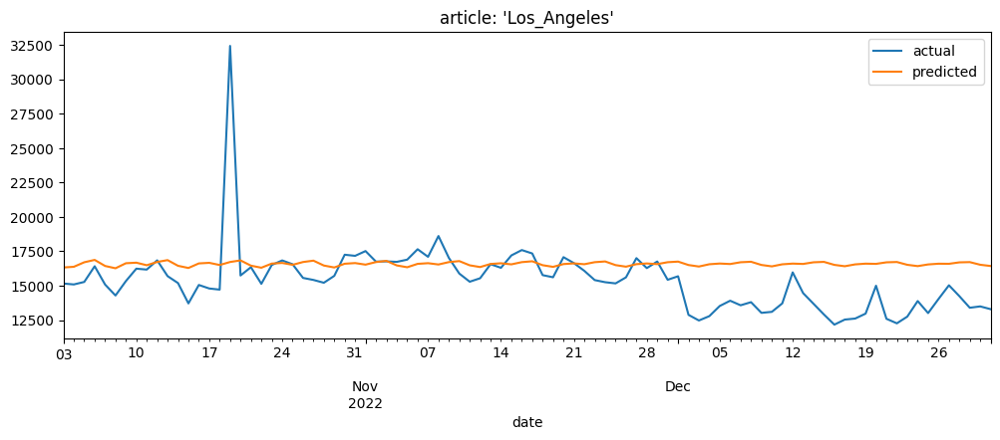

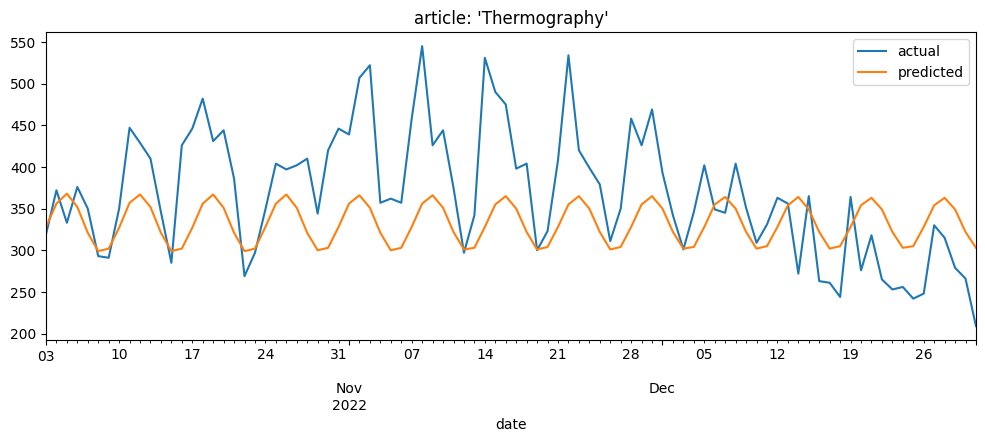

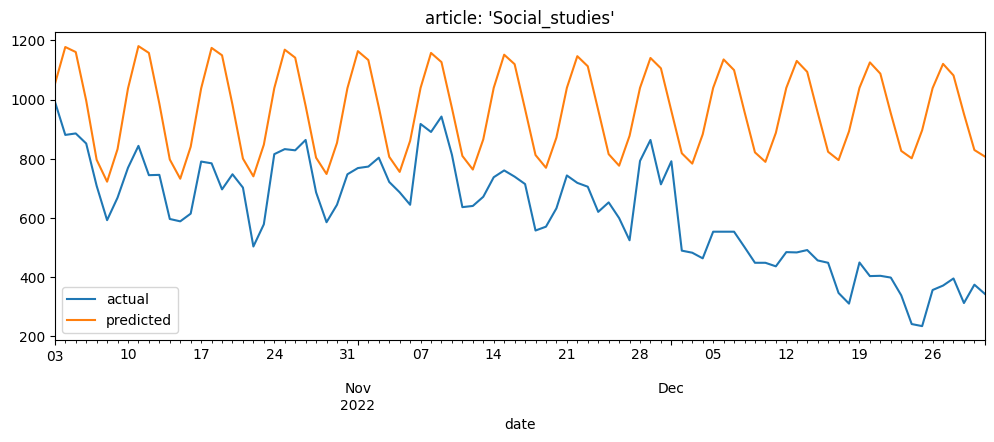

...

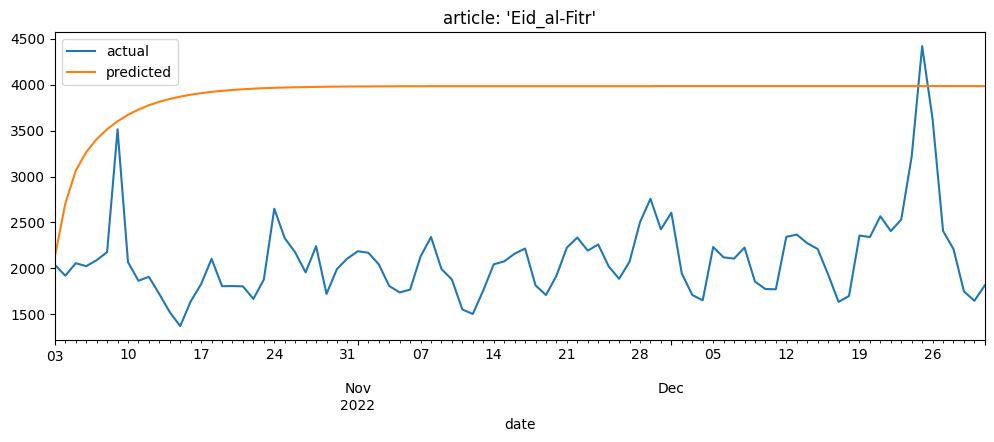

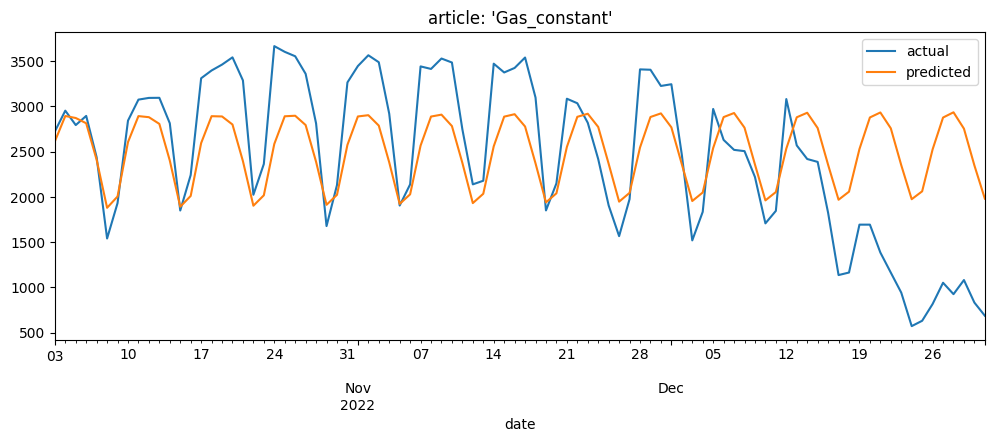

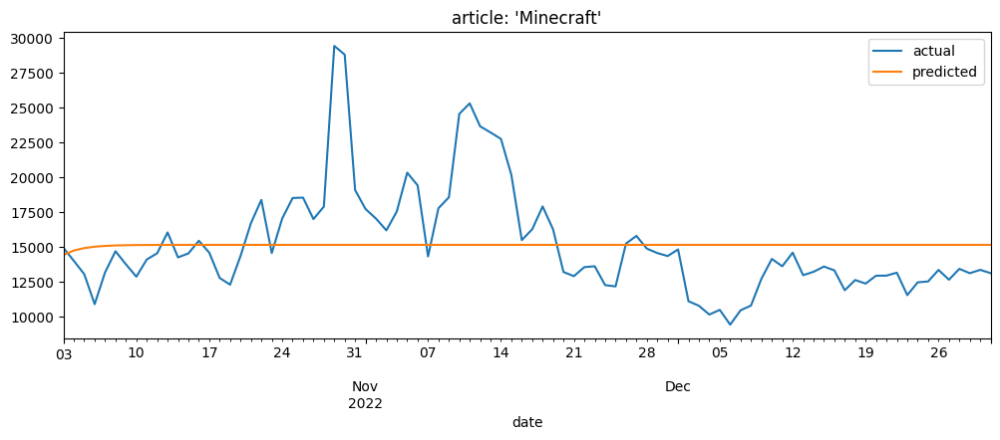

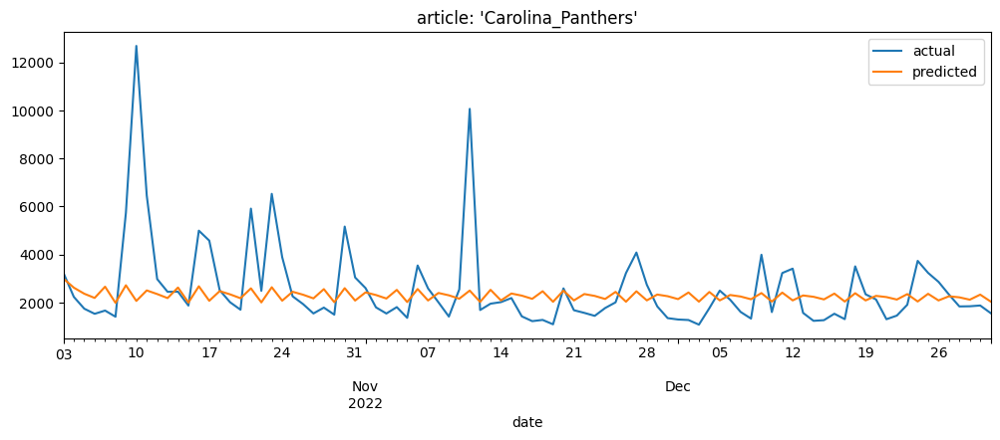

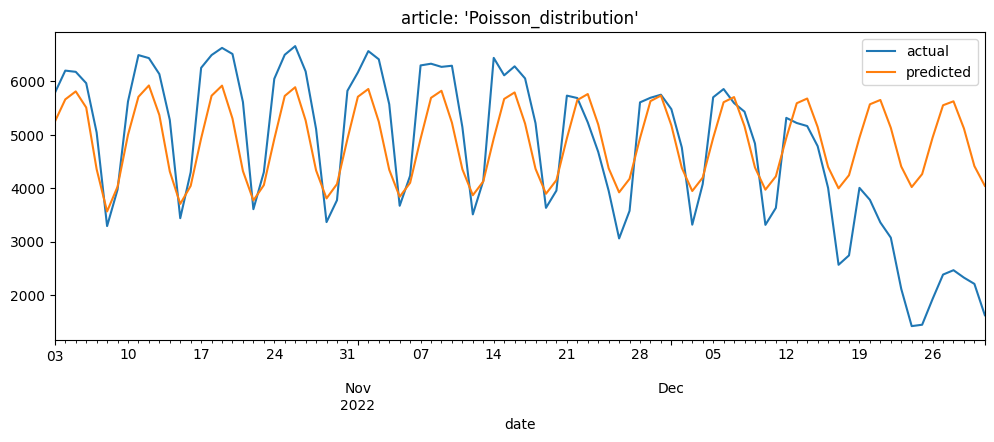

In [37]:
plot_results(predictions_arima)

In [38]:
# MAE, RMSE, and MAPE for ARIMA model.

errors_arima = evaluate_results(predictions_arima)
errors_arima

,mae,rmse,mape
Tarzan,221.844444,293.145963,0.145125
De_Morgan's_laws,233.277778,333.125285,0.27985
Los_Angeles,1779.411111,2640.587883,0.120628
Thermography,60.677778,75.267449,0.159012
Social_studies,337.811111,379.904973,0.67457
Normal_distribution,1583.833333,1867.623686,0.288412
Buddhism,843.633333,1213.067851,0.104527
Adobe_Photoshop,450.5,590.638026,0.131184
Viscosity,517.644444,634.90197,0.170443
Ferrero_Rocher,896.966667,1129.114338,0.353014


<a id='rnn'></a>
### Recurrent Neural Network (RNN) - LSTM

* **Recurrent Neural Network (RNN)** is a type of artificial neural network that is designed to process sequential data.
* In traditional neural networks, all the inputs and outputs are independent of each other.
* But in some cases such as forecasting a time series, the previous values must be remembered.
* RNN solves this issue with the help of a Hidden Layer.
* In RNN, the output from the previous step are fed as input to the current step.
* The most important feature of an RNN is hidden state, which remembers specific information about a sequence.
<br><br>
* The shortcoming of RNN is they cannot remember long-term dependencies due to vanishing gradient.
* It occurs when the gradients of the loss function (a measure of how well the neural network is performing) become very small during training.
* This causes the network to forget important information from earlier time steps.
* **Long Short-Term Memory (LSTM)** networks address this problem by introducing memory cells and gates that can selectively remember or forget information from earlier time steps.
* LSTMs capture the important patterns and dependencies in the input data, which makes it particularly effective for time series forecasting.

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

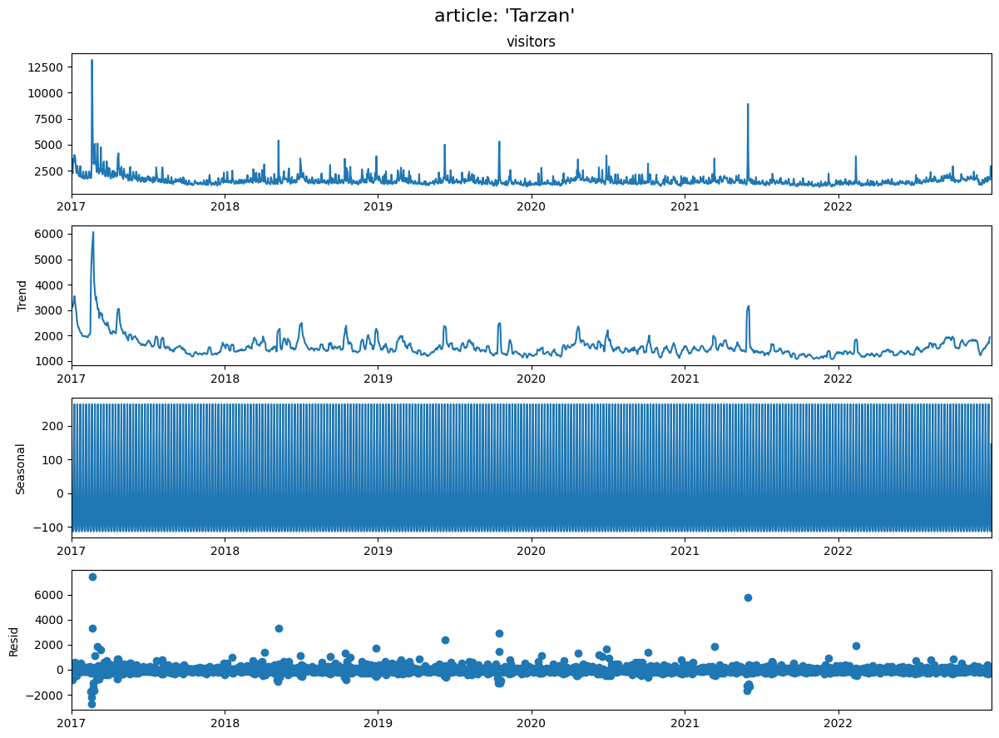

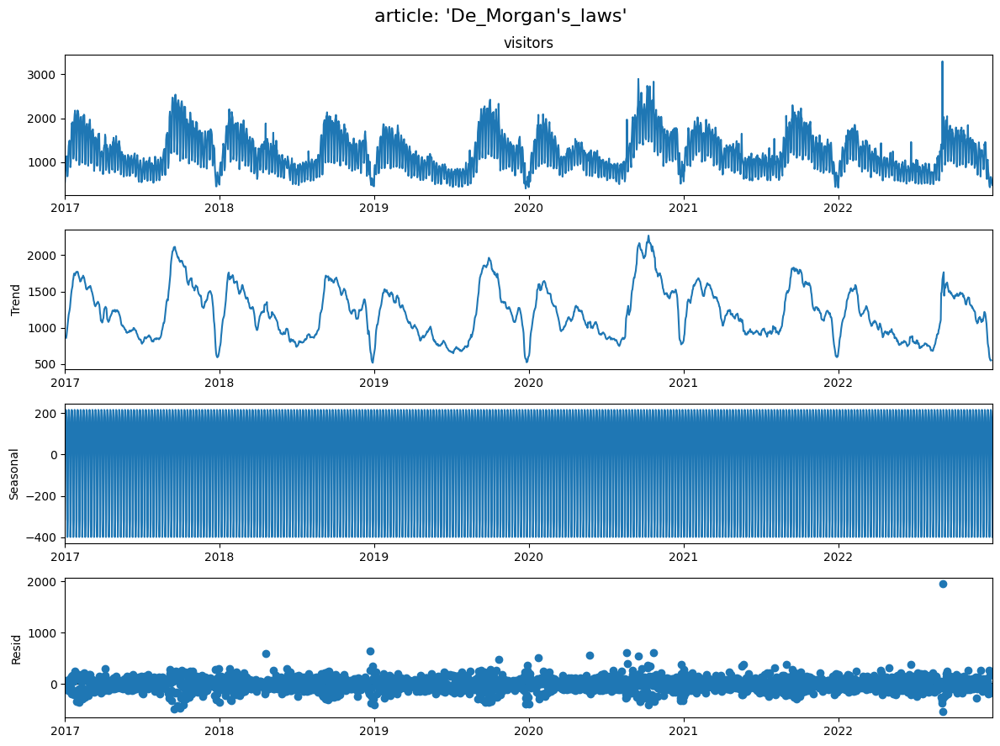

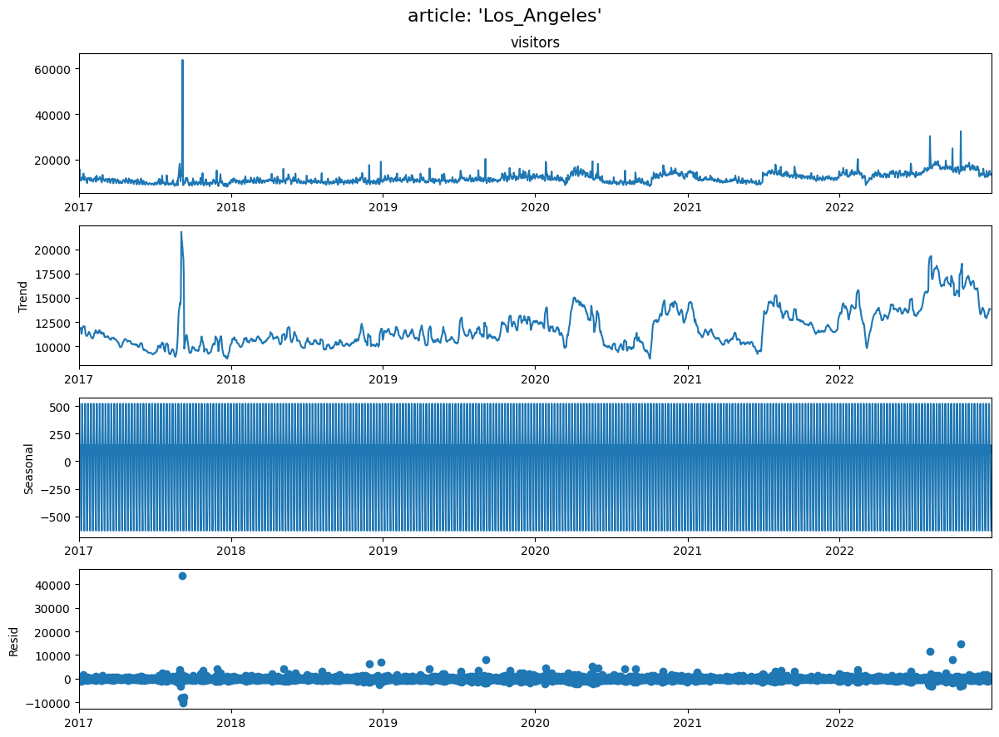

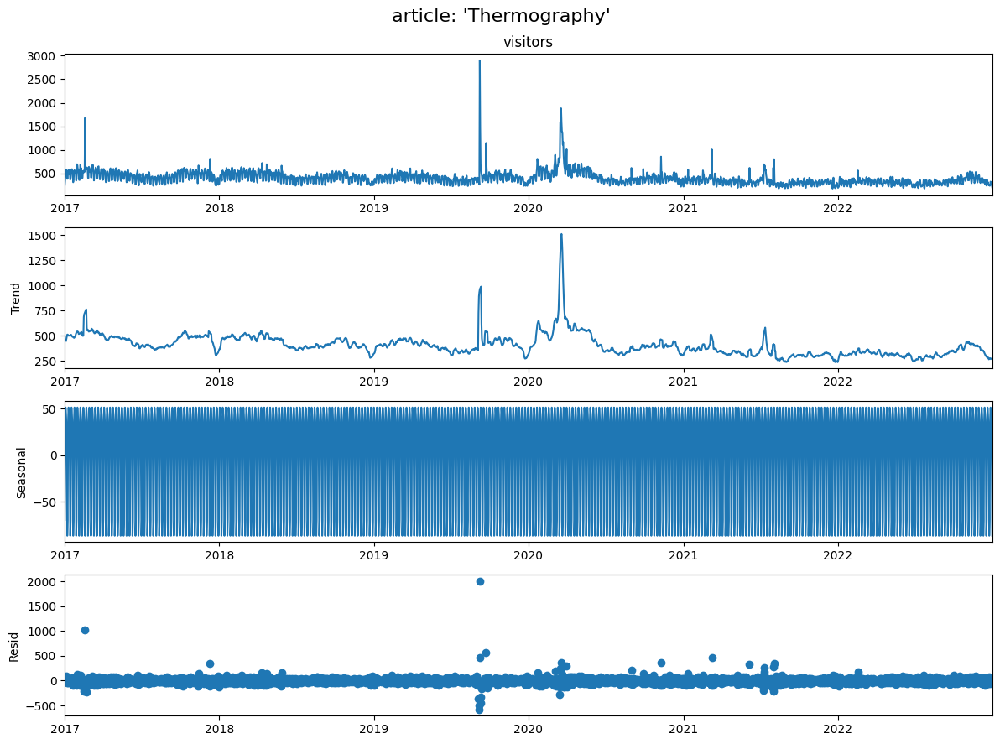

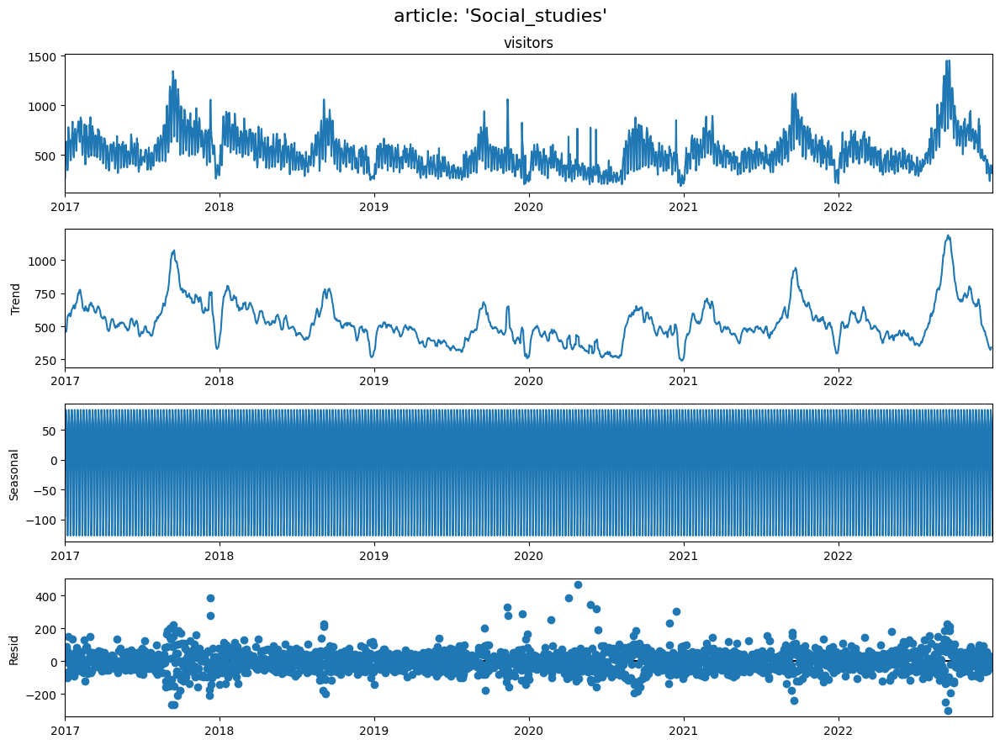

...

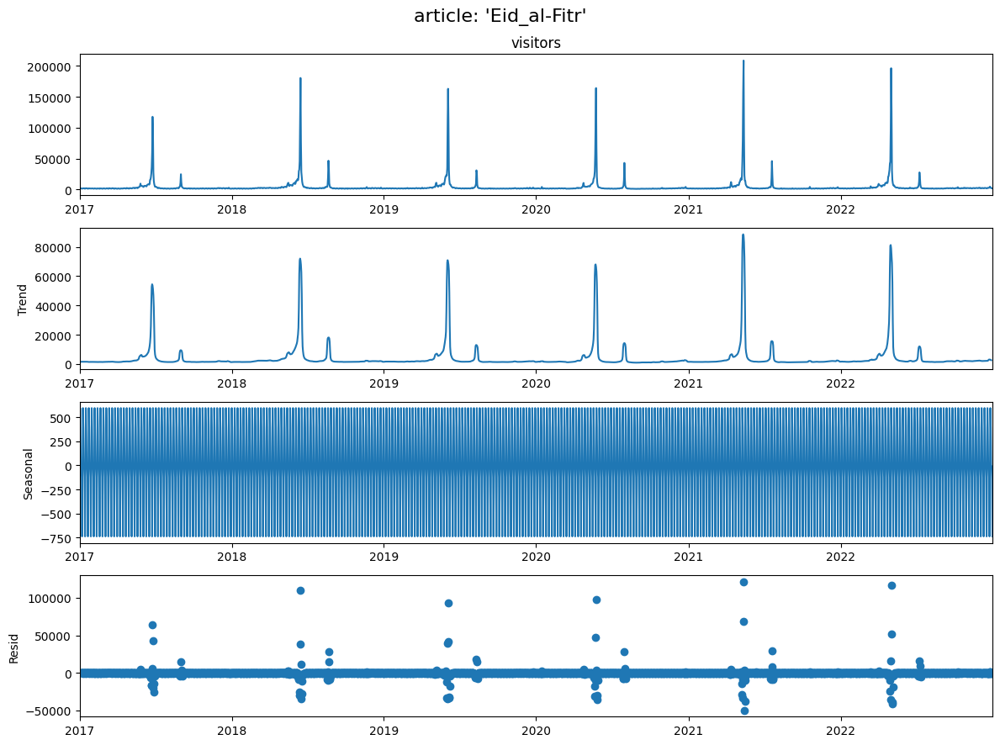

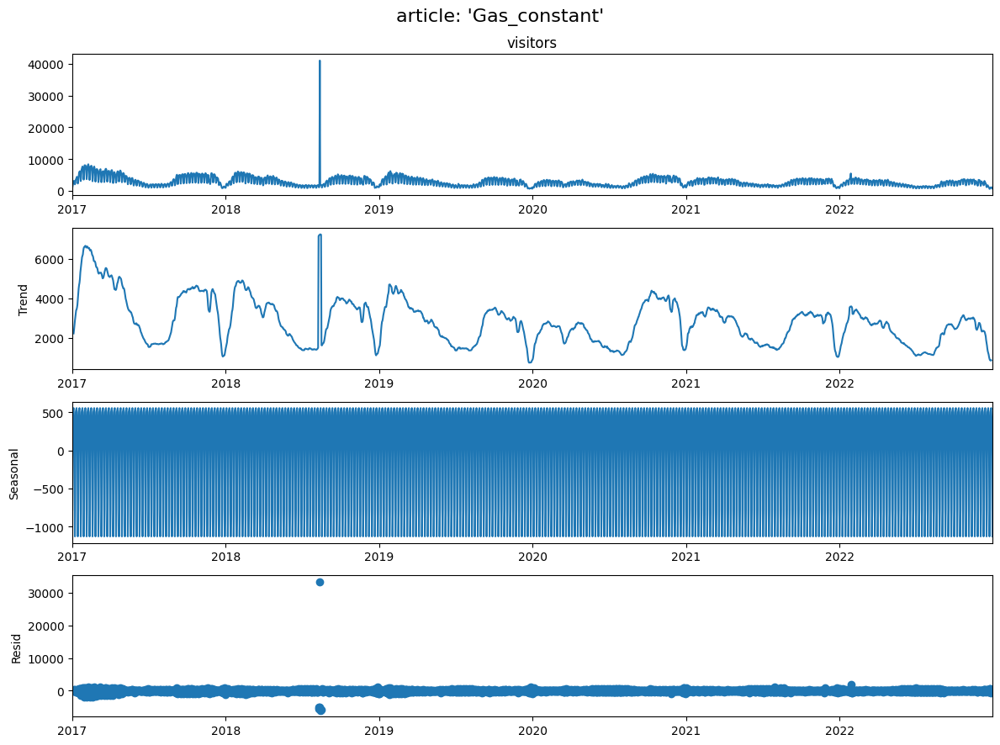

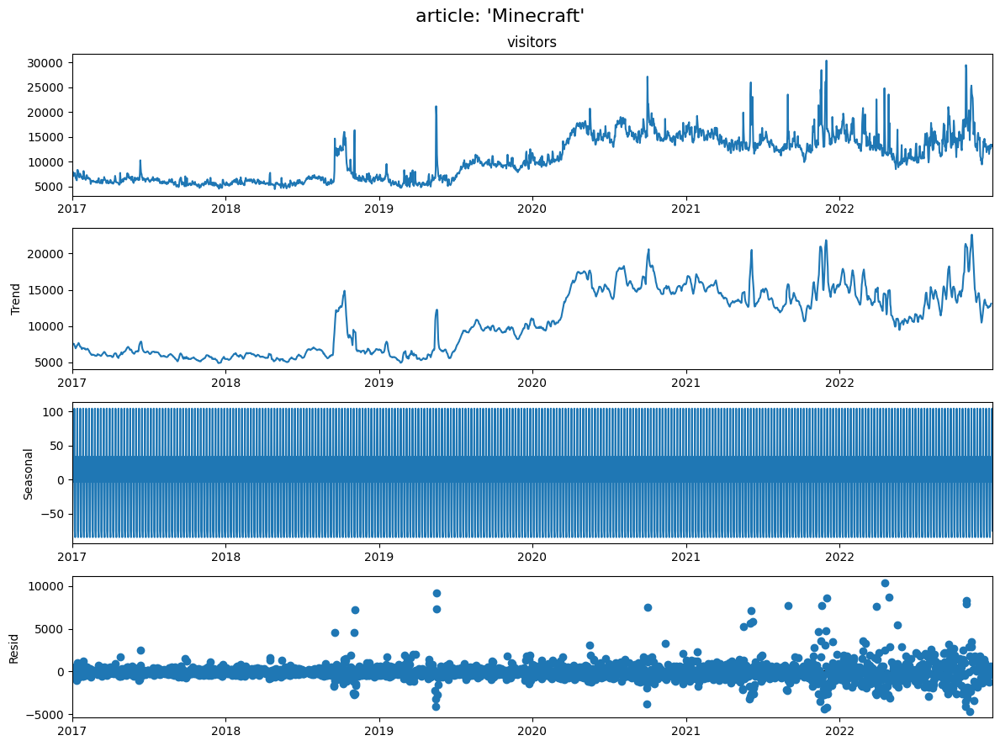

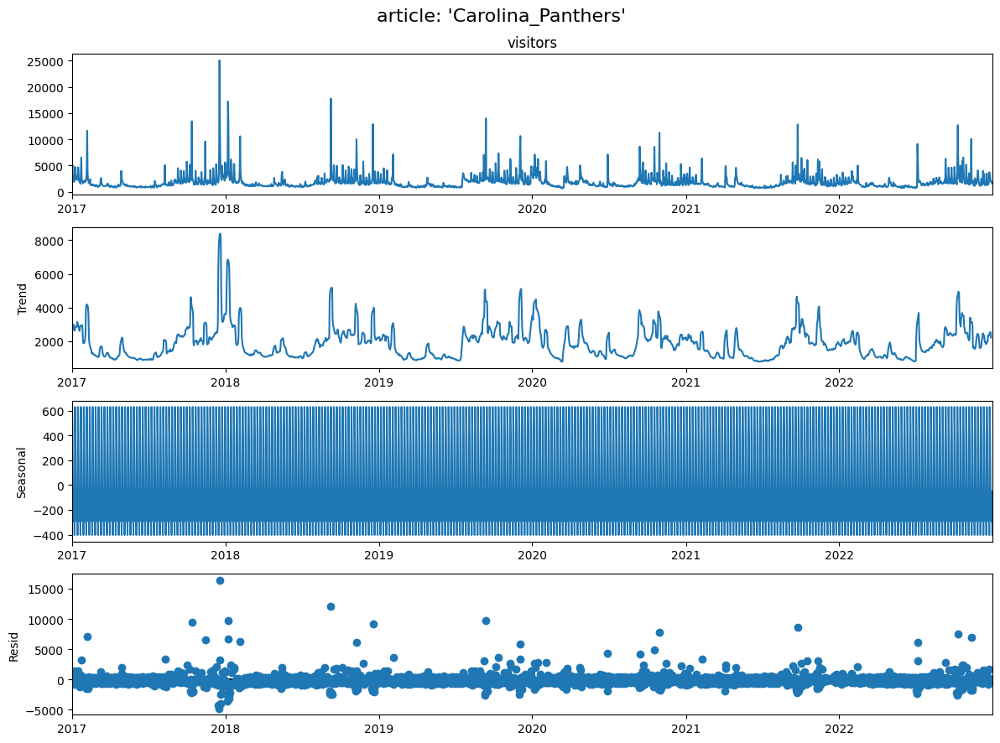

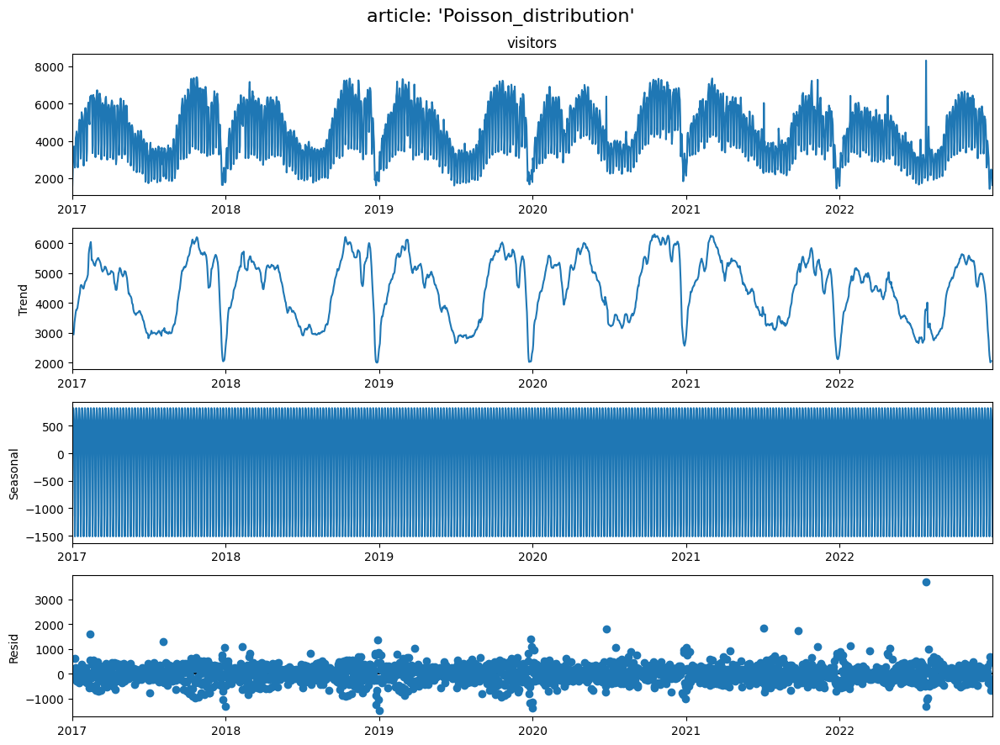

In [40]:
# Seasonal trend decomposition is used to decompose a time series into
# three components: trend, seasonal, and residual.

from statsmodels.tsa.seasonal import seasonal_decompose

for i in articles:
    df = data.loc[i]
    results = seasonal_decompose(df['visitors'])
    fig = results.plot()
    fig.suptitle("article: '" + i + "'", fontsize = 16)
    fig.set_size_inches((12, 9))
    fig.tight_layout()
    plt.show()

In [41]:
from sklearn.preprocessing import MinMaxScaler
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from tensorflow.keras import models

size = 90
predictions_rnn = pd.DataFrame(columns = df.index[-90:])

# By setting 'n_input' to 90, the model is trained to learn patterns in the time series data
# over a period of 90 days, which it can then use to make predictions.
n_input = 90
n_features = 1

In [22]:
for i in articles:
    df = data.loc[i]
    train = df.iloc[:len(df) - size]
    test = df.iloc[len(df) - size:]

    scaler = MinMaxScaler()
    scaler.fit(train)
    scaled_train = scaler.transform(train)
    scaled_test = scaler.transform(test)

    # Defining generator    
    generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

    # Defining the model
    model = Sequential()
    model.add(LSTM(100, activation='relu', input_shape=(n_input, n_features)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')

    # Fitting the model
    model.fit(generator,epochs=50)
    
    model.save("saved_models/" + i)

Epoch 1/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0011
Epoch 2/50
2011/2011 [==============================] - 27s 14ms/step - loss: 9.9700e-04
Epoch 3/50
2011/2011 [==============================] - 28s 14ms/step - loss: 9.5189e-04
Epoch 4/50
2011/2011 [==============================] - 28s 14ms/step - loss: 9.3857e-04
Epoch 5/50
2011/2011 [==============================] - 28s 14ms/step - loss: 9.1698e-04
Epoch 6/50
2011/2011 [==============================] - 28s 14ms/step - loss: 9.1596e-04
Epoch 7/50
2011/2011 [==============================] - 28s 14ms/step - loss: 9.0961e-04
Epoch 8/50
2011/2011 [==============================] - 28s 14ms/step - loss: 9.1328e-04
Epoch 9/50
2011/2011 [==============================] - 28s 14ms/step - loss: 9.0444e-04
Epoch 10/50
2011/2011 [==============================] - 28s 14ms/step - loss: 9.0021e-04
Epoch 11/50
2011/2011 [==============================] - 28s 14ms/step - loss: 8.8931e-04
Epoch 12/50
2011/2011 [

INFO:tensorflow:Assets written to: saved_models/Tarzan\assets


INFO:tensorflow:Assets written to: saved_models/Tarzan\assets


Epoch 1/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0129
Epoch 2/50
2011/2011 [==============================] - 27s 14ms/step - loss: 0.0104
Epoch 3/50
2011/2011 [==============================] - 27s 13ms/step - loss: 40.7625
Epoch 4/50
2011/2011 [==============================] - 27s 13ms/step - loss: 0.0094
Epoch 5/50
2011/2011 [==============================] - 27s 14ms/step - loss: 526.8296
Epoch 6/50
2011/2011 [==============================] - 27s 13ms/step - loss: 0.0111
Epoch 7/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0107
Epoch 8/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0100
Epoch 9/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0092
Epoch 10/50
2011/2011 [==============================] - 27s 14ms/step - loss: 0.0080
Epoch 11/50
2011/2011 [==============================] - 27s 14ms/step - loss: 0.0066
Epoch 12/50
2011/2011 [==============================] - 27s

INFO:tensorflow:Assets written to: saved_models/De_Morgan's_laws\assets


INFO:tensorflow:Assets written to: saved_models/De_Morgan's_laws\assets


Epoch 1/50
2011/2011 [==============================] - 28s 13ms/step - loss: 0.0011
Epoch 2/50
2011/2011 [==============================] - 28s 14ms/step - loss: 9.6302e-04
Epoch 3/50
2011/2011 [==============================] - 26s 13ms/step - loss: 8.9335e-04
Epoch 4/50
2011/2011 [==============================] - 28s 14ms/step - loss: 8.9136e-04
Epoch 5/50
2011/2011 [==============================] - 28s 14ms/step - loss: 8.6618e-04
Epoch 6/50
2011/2011 [==============================] - 28s 14ms/step - loss: 8.5643e-04
Epoch 7/50
2011/2011 [==============================] - 27s 14ms/step - loss: 8.6156e-04
Epoch 8/50
2011/2011 [==============================] - 27s 13ms/step - loss: 8.3338e-04
Epoch 9/50
2011/2011 [==============================] - 28s 14ms/step - loss: 8.2036e-04
Epoch 10/50
2011/2011 [==============================] - 28s 14ms/step - loss: 8.1762e-04
Epoch 11/50
2011/2011 [==============================] - 28s 14ms/step - loss: 8.1284e-04
Epoch 12/50
2011/2011 [

INFO:tensorflow:Assets written to: saved_models/Los_Angeles\assets


INFO:tensorflow:Assets written to: saved_models/Los_Angeles\assets


Epoch 1/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0019
Epoch 2/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0017
Epoch 3/50
2011/2011 [==============================] - 27s 13ms/step - loss: 0.0015
Epoch 4/50
2011/2011 [==============================] - 27s 13ms/step - loss: 0.0015
Epoch 5/50
2011/2011 [==============================] - 27s 13ms/step - loss: 0.0014
Epoch 6/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0013
Epoch 7/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0012
Epoch 8/50
2011/2011 [==============================] - 30s 15ms/step - loss: 0.0012
Epoch 9/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0012
Epoch 10/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0012
Epoch 11/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0012
Epoch 12/50
2011/2011 [==============================] - 30s 15

INFO:tensorflow:Assets written to: saved_models/Thermography\assets


INFO:tensorflow:Assets written to: saved_models/Thermography\assets


Epoch 1/50
2011/2011 [==============================] - 30s 14ms/step - loss: 0.0107
Epoch 2/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0081
Epoch 3/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0042
Epoch 4/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0037
Epoch 5/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0037
Epoch 6/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0035
Epoch 7/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0034
Epoch 8/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0033
Epoch 9/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0032
Epoch 10/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0033
Epoch 11/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0032
Epoch 12/50
2011/2011 [==============================] - 29s 14

INFO:tensorflow:Assets written to: saved_models/Social_studies\assets


INFO:tensorflow:Assets written to: saved_models/Social_studies\assets


Epoch 1/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0299
Epoch 2/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0112
Epoch 3/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0038
Epoch 4/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0032
Epoch 5/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0030
Epoch 6/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0027
Epoch 7/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0026
Epoch 8/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0027
Epoch 9/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0026
Epoch 10/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0025
Epoch 11/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0024
Epoch 12/50
2011/2011 [==============================] - 29s 14

INFO:tensorflow:Assets written to: saved_models/Normal_distribution\assets


INFO:tensorflow:Assets written to: saved_models/Normal_distribution\assets


Epoch 1/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0048
Epoch 2/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0044
Epoch 3/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0043
Epoch 4/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0041
Epoch 5/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0040
Epoch 6/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0037
Epoch 7/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0035
Epoch 8/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0035
Epoch 9/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0033
Epoch 10/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0033
Epoch 11/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0033
Epoch 12/50
2011/2011 [==============================] - 28s 14

INFO:tensorflow:Assets written to: saved_models/Buddhism\assets


INFO:tensorflow:Assets written to: saved_models/Buddhism\assets


Epoch 1/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0053
Epoch 2/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0045
Epoch 3/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0032
Epoch 4/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0029
Epoch 5/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0028
Epoch 6/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0027
Epoch 7/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0026
Epoch 8/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0025
Epoch 9/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0030
Epoch 10/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0026
Epoch 11/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0024
Epoch 12/50
2011/2011 [==============================] - 28s 14

INFO:tensorflow:Assets written to: saved_models/Adobe_Photoshop\assets


INFO:tensorflow:Assets written to: saved_models/Adobe_Photoshop\assets


Epoch 1/50
2011/2011 [==============================] - 30s 15ms/step - loss: 0.0195
Epoch 2/50
2011/2011 [==============================] - 29s 14ms/step - loss: 46444312.0000
Epoch 3/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0149
Epoch 4/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0092
Epoch 5/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0059
Epoch 6/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0054
Epoch 7/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0052
Epoch 8/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0049
Epoch 9/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0047
Epoch 10/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0043
Epoch 11/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0037
Epoch 12/50
2011/2011 [==============================] -

INFO:tensorflow:Assets written to: saved_models/Viscosity\assets


INFO:tensorflow:Assets written to: saved_models/Viscosity\assets


Epoch 1/50
2011/2011 [==============================] - 30s 15ms/step - loss: 0.0026
Epoch 2/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0016
Epoch 3/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0014
Epoch 4/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0013
Epoch 5/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0012
Epoch 6/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0012
Epoch 7/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0012
Epoch 8/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0012
Epoch 9/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0011
Epoch 10/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0011
Epoch 11/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0011
Epoch 12/50
2011/2011 [==============================] - 29s 14

INFO:tensorflow:Assets written to: saved_models/Ferrero_Rocher\assets


INFO:tensorflow:Assets written to: saved_models/Ferrero_Rocher\assets


Epoch 1/50
2011/2011 [==============================] - 30s 14ms/step - loss: 0.0027
Epoch 2/50
2011/2011 [==============================] - 30s 15ms/step - loss: 0.0018
Epoch 3/50
2011/2011 [==============================] - 30s 15ms/step - loss: 0.0019
Epoch 4/50
2011/2011 [==============================] - 31s 15ms/step - loss: 0.0012
Epoch 5/50
2011/2011 [==============================] - 30s 15ms/step - loss: 8.5850e-04
Epoch 6/50
2011/2011 [==============================] - 29s 14ms/step - loss: 9.0141e-04
Epoch 7/50
2011/2011 [==============================] - 29s 15ms/step - loss: 9.0025e-04
Epoch 8/50
2011/2011 [==============================] - 29s 14ms/step - loss: 6.2124e-04
Epoch 9/50
2011/2011 [==============================] - 29s 15ms/step - loss: 6.4342e-04
Epoch 10/50
2011/2011 [==============================] - 29s 15ms/step - loss: 5.2401e-04
Epoch 11/50
2011/2011 [==============================] - 29s 15ms/step - loss: 5.5008e-04
Epoch 12/50
2011/2011 [============

INFO:tensorflow:Assets written to: saved_models/Eid_al-Fitr\assets


INFO:tensorflow:Assets written to: saved_models/Eid_al-Fitr\assets


Epoch 1/50
2011/2011 [==============================] - 32s 15ms/step - loss: 9.7893e-04
Epoch 2/50
2011/2011 [==============================] - 31s 15ms/step - loss: 9.1757e-04
Epoch 3/50
2011/2011 [==============================] - 31s 15ms/step - loss: 8.8176e-04
Epoch 4/50
2011/2011 [==============================] - 31s 15ms/step - loss: 8.3632e-04
Epoch 5/50
2011/2011 [==============================] - 31s 15ms/step - loss: 6.8613e-04
Epoch 6/50
2011/2011 [==============================] - 31s 15ms/step - loss: 6.4803e-04
Epoch 7/50
2011/2011 [==============================] - 31s 15ms/step - loss: 6.3826e-04
Epoch 8/50
2011/2011 [==============================] - 31s 15ms/step - loss: 6.2601e-04
Epoch 9/50
2011/2011 [==============================] - 31s 15ms/step - loss: 6.4671e-04
Epoch 10/50
2011/2011 [==============================] - 31s 15ms/step - loss: 6.2457e-04
Epoch 11/50
2011/2011 [==============================] - 31s 15ms/step - loss: 6.1692e-04
Epoch 12/50
2011/20

INFO:tensorflow:Assets written to: saved_models/Gas_constant\assets


INFO:tensorflow:Assets written to: saved_models/Gas_constant\assets


Epoch 1/50
2011/2011 [==============================] - 30s 14ms/step - loss: 0.0043
Epoch 2/50
2011/2011 [==============================] - 29s 15ms/step - loss: 0.0032
Epoch 3/50
2011/2011 [==============================] - 29s 15ms/step - loss: 0.0029
Epoch 4/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0028
Epoch 5/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0028
Epoch 6/50
2011/2011 [==============================] - 29s 15ms/step - loss: 0.0026
Epoch 7/50
2011/2011 [==============================] - 30s 15ms/step - loss: 0.0027
Epoch 8/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0026
Epoch 9/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0026
Epoch 10/50
2011/2011 [==============================] - 29s 15ms/step - loss: 0.0026
Epoch 11/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0026
Epoch 12/50
2011/2011 [==============================] - 29s 15

INFO:tensorflow:Assets written to: saved_models/Minecraft\assets


INFO:tensorflow:Assets written to: saved_models/Minecraft\assets


Epoch 1/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0030
Epoch 2/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0028
Epoch 3/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0027
Epoch 4/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0026
Epoch 5/50
2011/2011 [==============================] - 28s 14ms/step - loss: 0.0026
Epoch 6/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0026
Epoch 7/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0026
Epoch 8/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0026
Epoch 9/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0025
Epoch 10/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0026
Epoch 11/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0025
Epoch 12/50
2011/2011 [==============================] - 29s 14

INFO:tensorflow:Assets written to: saved_models/Carolina_Panthers\assets


INFO:tensorflow:Assets written to: saved_models/Carolina_Panthers\assets


Epoch 1/50
2011/2011 [==============================] - 30s 15ms/step - loss: 0.0277
Epoch 2/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0111
Epoch 3/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0064
Epoch 4/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0040
Epoch 5/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0034
Epoch 6/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0043
Epoch 7/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0031
Epoch 8/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0031
Epoch 9/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0030
Epoch 10/50
2011/2011 [==============================] - 29s 14ms/step - loss: 0.0030
Epoch 11/50
2011/2011 [==============================] - 29s 15ms/step - loss: 0.0030
Epoch 12/50
2011/2011 [==============================] - 29s 15

INFO:tensorflow:Assets written to: saved_models/Poisson_distribution\assets


INFO:tensorflow:Assets written to: saved_models/Poisson_distribution\assets


In [42]:
for i in articles:
    df = data.loc[i]
    train = df.iloc[:len(df) - size]
    test = df.iloc[len(df) - size:]

    scaler = MinMaxScaler()
    scaler.fit(train)
    scaled_train = scaler.transform(train)
    scaled_test = scaler.transform(test)
    
    model = models.load_model("saved_models/" + i)

    last_train_batch = scaled_train[-n_input:]
    last_train_batch = last_train_batch.reshape((1, n_input, n_features))
    model.predict(last_train_batch)

    test_predictions = []

    first_eval_batch = scaled_train[-n_input:]
    current_batch = first_eval_batch.reshape((1, n_input, n_features))

    # Sliding window is used to create input sequences for the model.
    for j in range(len(test)):

        # Get the prediction value for the first batch
        current_pred = model.predict(current_batch)[0]

        # Append the prediction into the array
        test_predictions.append(current_pred) 

        # Use the prediction to update the batch and remove the first value
        current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

    true_predictions = scaler.inverse_transform(test_predictions)
    predictions_rnn.loc[i] = true_predictions.flatten()

1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 21ms/step


In [53]:
for col in predictions_rnn.columns:
    predictions_rnn[col] = predictions_rnn[col].astype('int')
predictions_rnn.index.rename('article', inplace = True)
predictions_rnn.to_csv('predictions\predictions__rnn.csv')

In [150]:
# Predictions using RNN
predictions_rnn = pd.read_csv('predictions\predictions_rnn.csv')
predictions_rnn.set_index('article', inplace = True)
predictions_rnn.columns = df.index[-90:]
predictions_rnn

date,2022-10-03,2022-10-04,2022-10-05,2022-10-06,2022-10-07,2022-10-08,2022-10-09,2022-10-10,2022-10-11,2022-10-12,...,2022-12-22,2022-12-23,2022-12-24,2022-12-25,2022-12-26,2022-12-27,2022-12-28,2022-12-29,2022-12-30,2022-12-31
article,,,,,,,,,,,,,,,,,,,,,
Tarzan,1735,1528,1503,1592,1695,1752,1683,1537,1424,1421,...,1526,1521,1505,1493,1493,1505,1519,1524,1516,1502
De_Morgan's_laws,1524,1581,1531,1475,1223,819,899,1330,1383,1330,...,926,771,562,615,890,945,954,926,771,562
Los_Angeles,14534,14218,13852,14089,13959,13698,14726,15133,14680,15394,...,15332,14980,14452,16317,15993,15631,16534,16042,15733,16253
Thermography,380,385,387,380,326,275,331,414,413,409,...,408,358,281,306,423,429,424,408,358,281
Social_studies,955,817,706,721,653,365,489,810,764,887,...,489,509,327,550,254,317,716,375,448,61
Normal_distribution,10087,8920,6851,8279,6235,3652,5278,10066,9607,8431,...,3586,4862,-497,2099,2309,5590,6296,3426,3903,1608
Buddhism,6483,7825,7896,6697,5948,6548,7596,7697,7902,7307,...,5869,6202,5181,5135,6394,7019,6099,6113,5353,5033
Adobe_Photoshop,4933,4475,5414,4490,3603,3006,2892,5251,4327,5246,...,4265,3462,3250,1809,2930,3747,2698,3692,3239,1872
Viscosity,4172,3015,3228,3548,1726,2082,1657,2903,2736,4245,...,2984,749,1136,238,2576,1735,2340,1014,2163,347


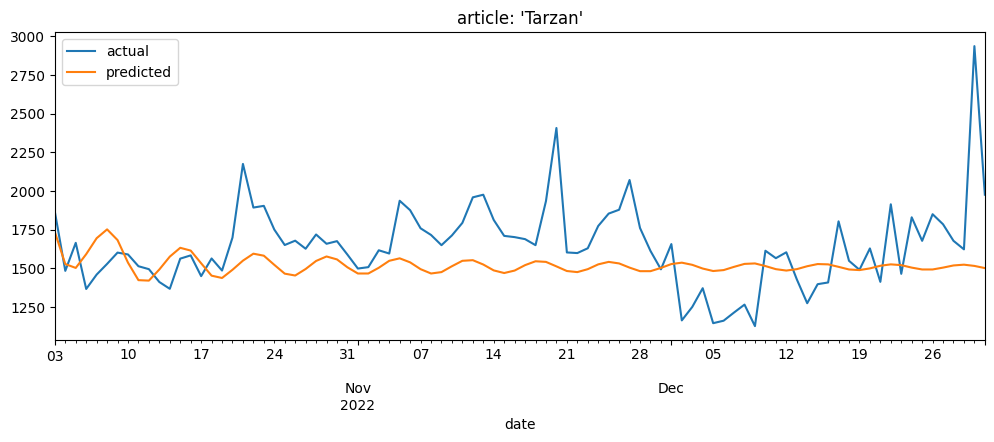

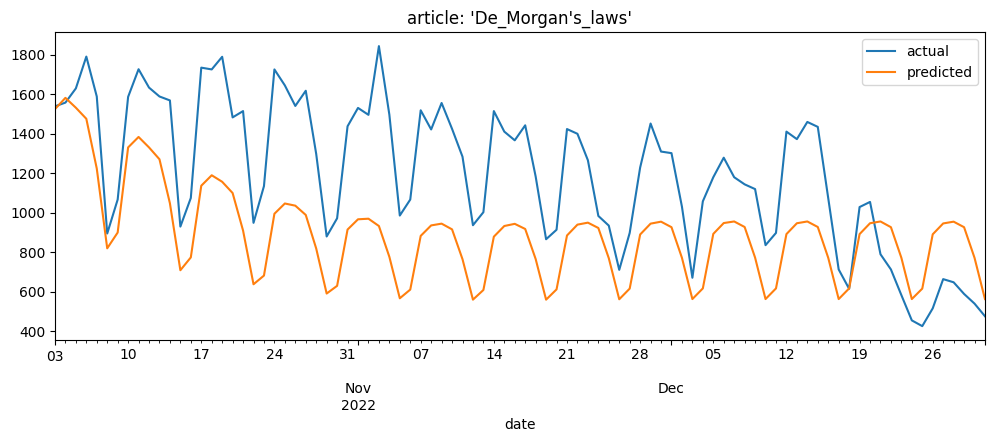

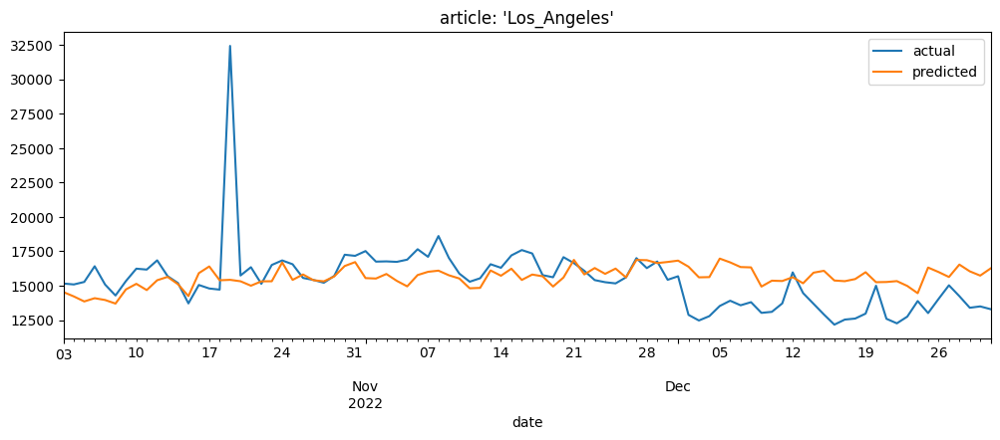

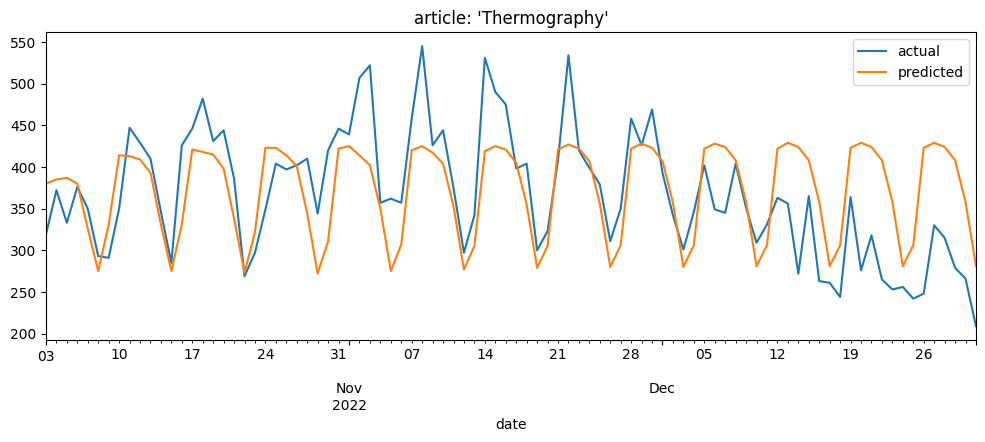

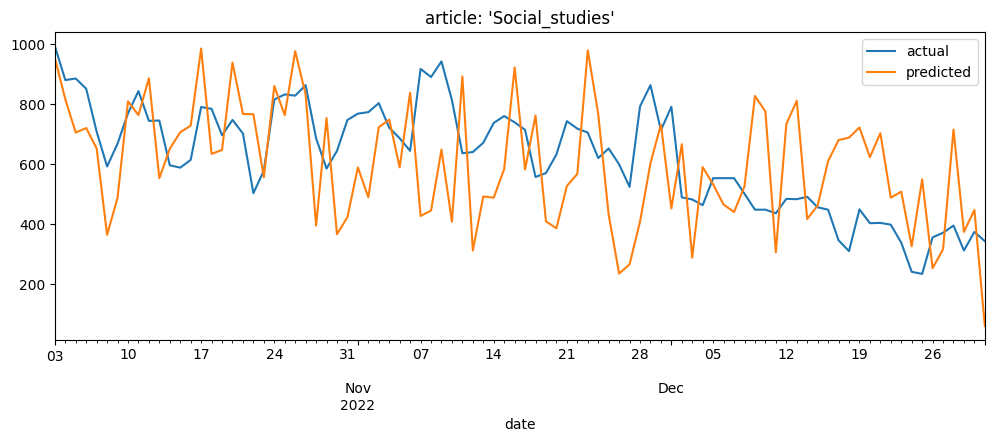

...

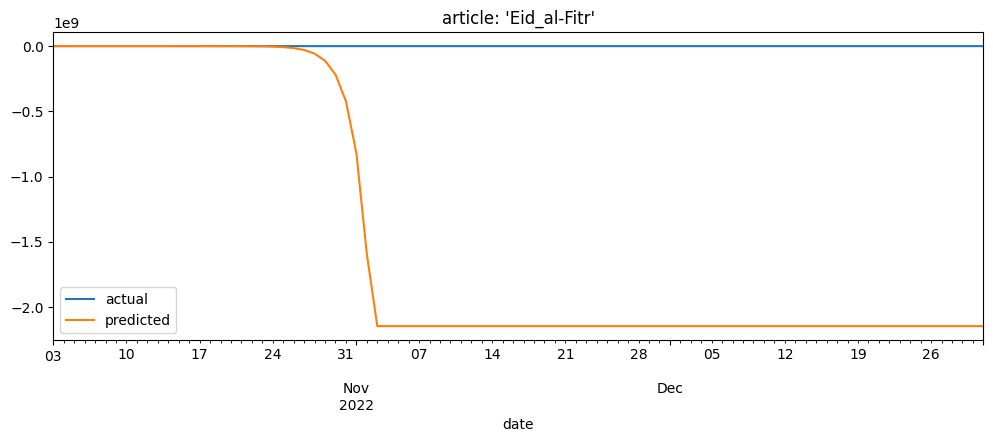

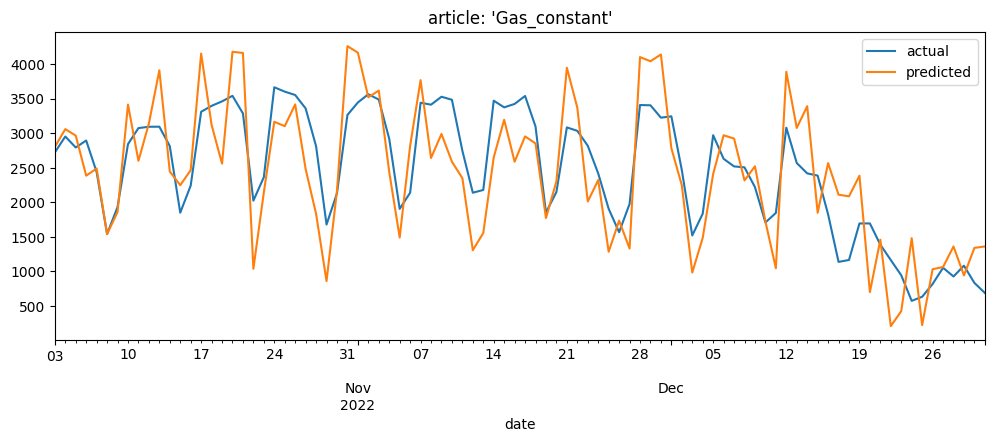

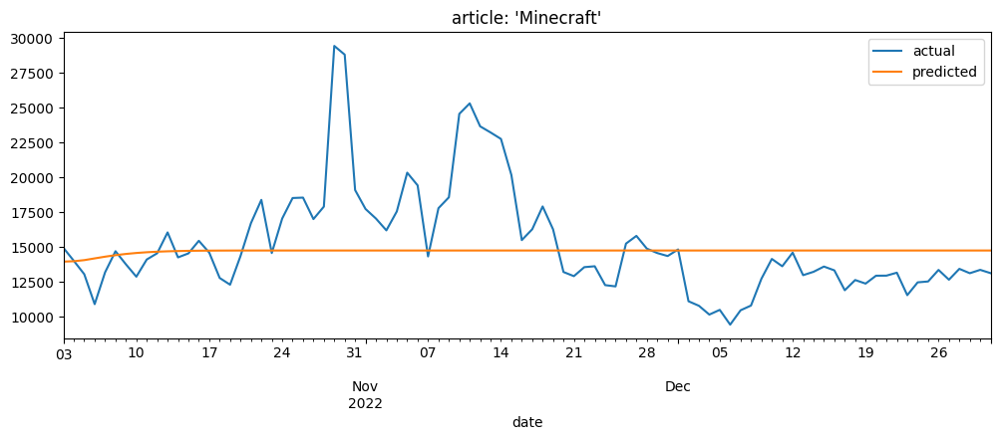

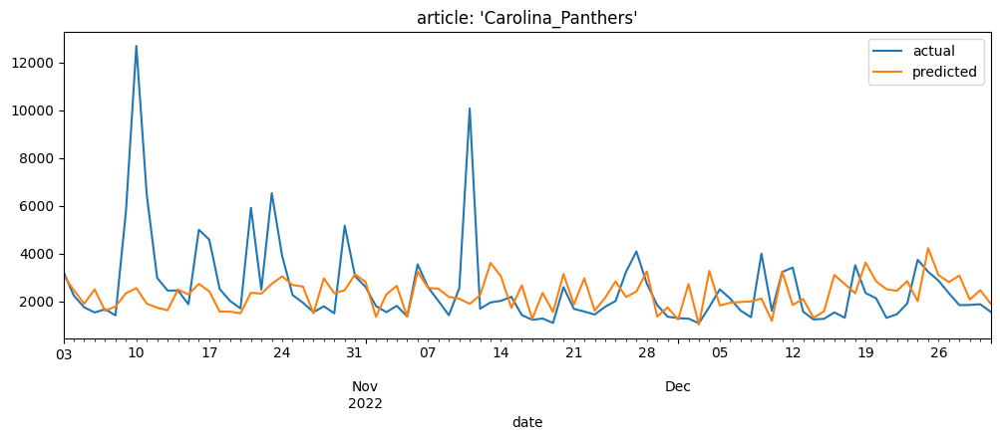

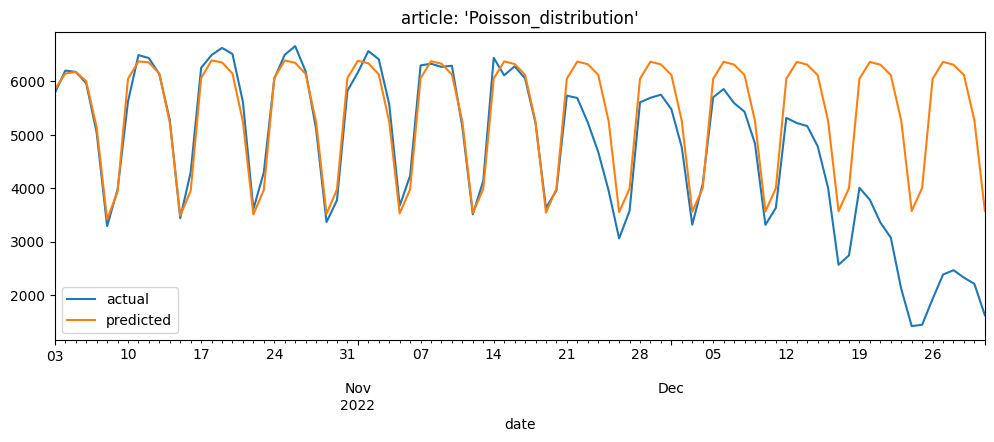

In [151]:
plot_results(predictions_rnn)

In [152]:
# MAE, RMSE, and MAPE for RNN

errors_rnn = evaluate_results(predictions_rnn)
errors_rnn

,mae,rmse,mape
Tarzan,220.677778,294.07295,0.128806
De_Morgan's_laws,362.333333,404.766572,0.304283
Los_Angeles,1539.2,2465.768377,0.100127
Thermography,50.455556,64.816922,0.148544
Social_studies,184.577778,216.13977,0.329745
Normal_distribution,1026.811111,1249.267301,0.166678
Buddhism,1138.611111,1475.401508,0.140793
Adobe_Photoshop,602.122222,681.197891,0.161501
Viscosity,560.7,704.960432,0.207487
Ferrero_Rocher,637.333333,808.01481,0.263311


<a id='prophet'></a>
### Facebook Prophet

* Prophet is an open-source tool from Facebook used for time series forecasting.
* It is based on a decomposable additive model where non-linear trends are fit with yearly, weekly, and daily seasonality.
* It also takes into account the effect of holidays.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from prophet import Prophet

18:04:16 - cmdstanpy - INFO - Chain [1] start processing
18:04:16 - cmdstanpy - INFO - Chain [1] done processing


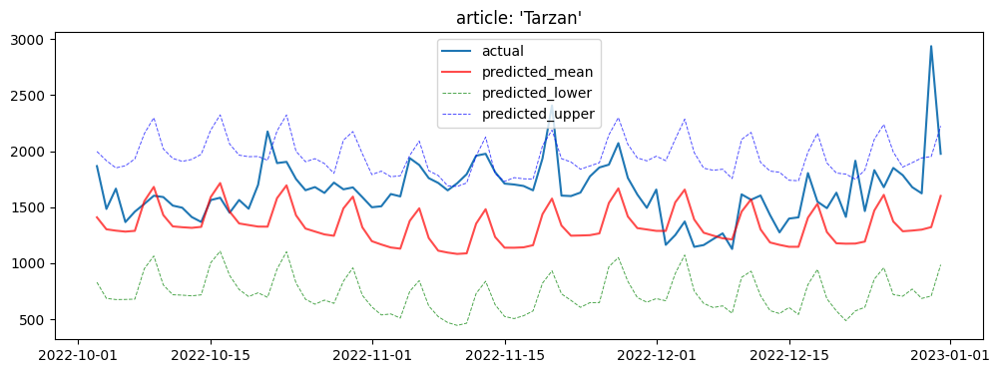

18:04:17 - cmdstanpy - INFO - Chain [1] start processing
18:04:18 - cmdstanpy - INFO - Chain [1] done processing


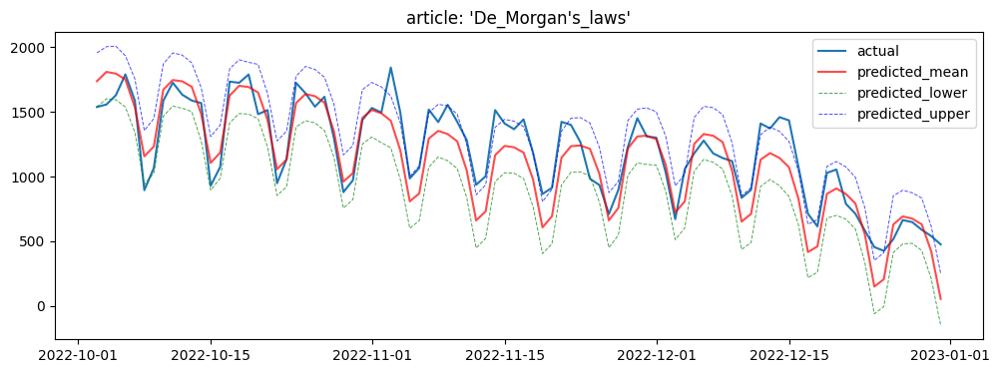

18:04:19 - cmdstanpy - INFO - Chain [1] start processing
18:04:19 - cmdstanpy - INFO - Chain [1] done processing


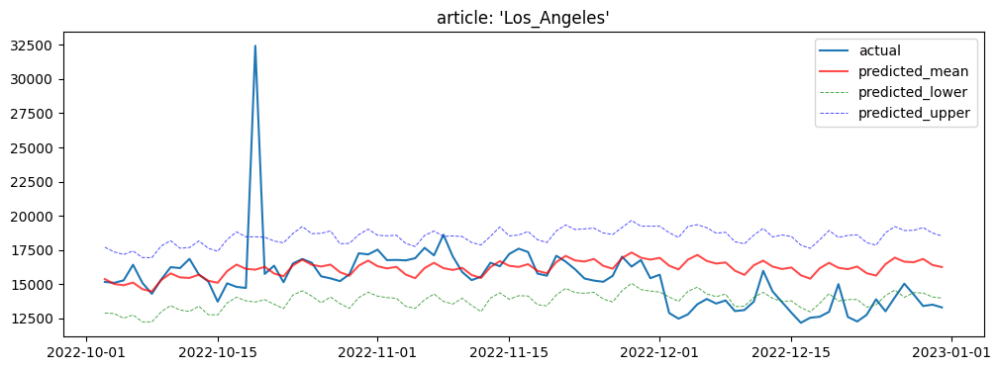

18:04:21 - cmdstanpy - INFO - Chain [1] start processing
18:04:21 - cmdstanpy - INFO - Chain [1] done processing


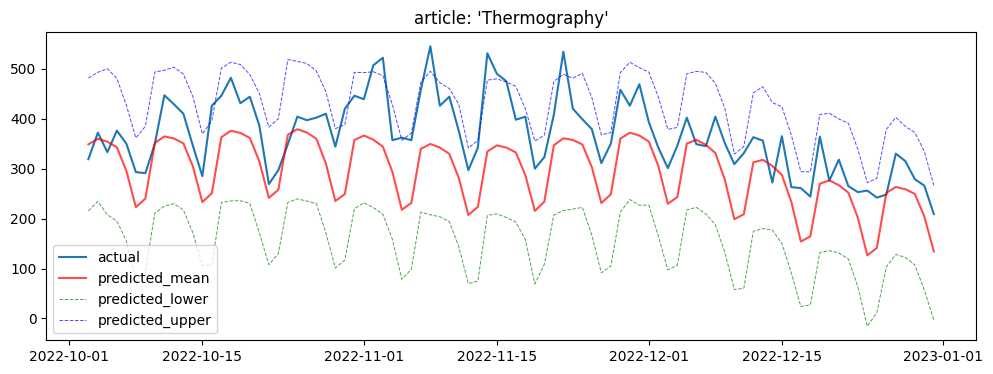

18:04:22 - cmdstanpy - INFO - Chain [1] start processing
18:04:22 - cmdstanpy - INFO - Chain [1] done processing


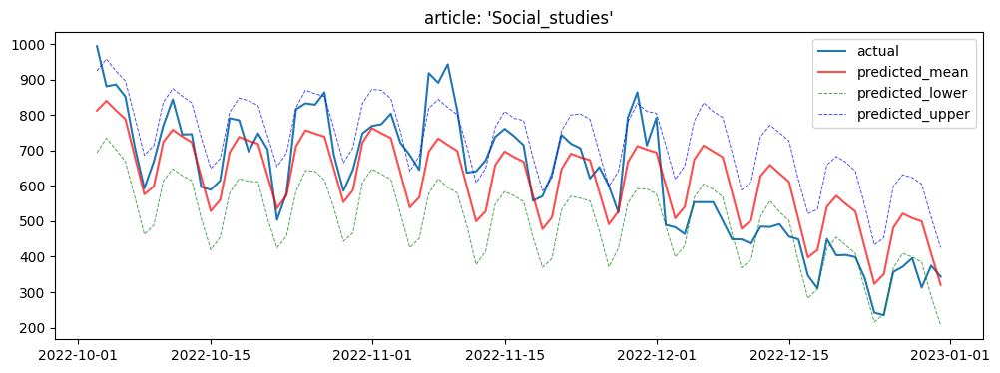

18:04:23 - cmdstanpy - INFO - Chain [1] start processing
18:04:24 - cmdstanpy - INFO - Chain [1] done processing


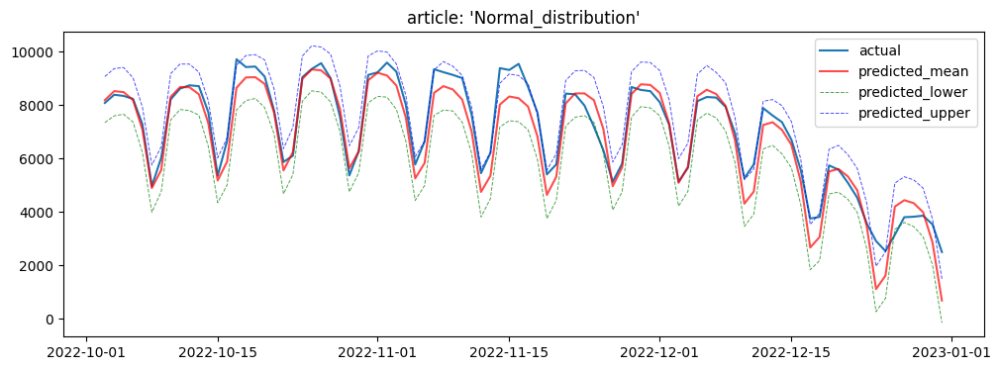

18:04:25 - cmdstanpy - INFO - Chain [1] start processing
18:04:25 - cmdstanpy - INFO - Chain [1] done processing


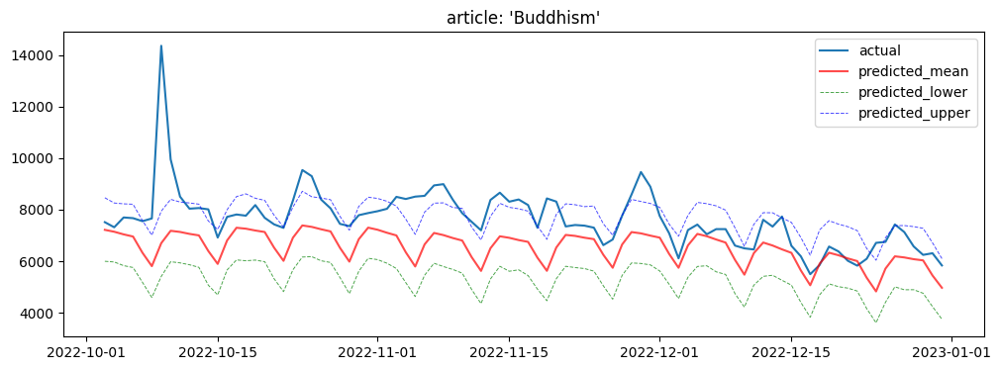

18:04:26 - cmdstanpy - INFO - Chain [1] start processing
18:04:26 - cmdstanpy - INFO - Chain [1] done processing


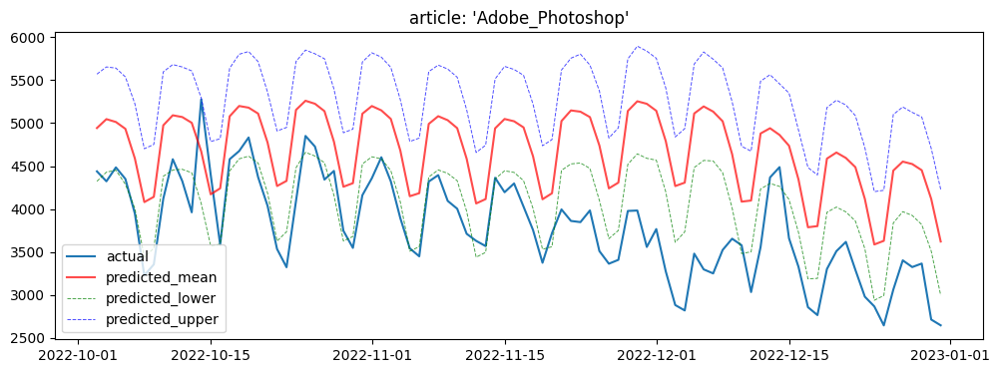

18:04:27 - cmdstanpy - INFO - Chain [1] start processing
18:04:28 - cmdstanpy - INFO - Chain [1] done processing


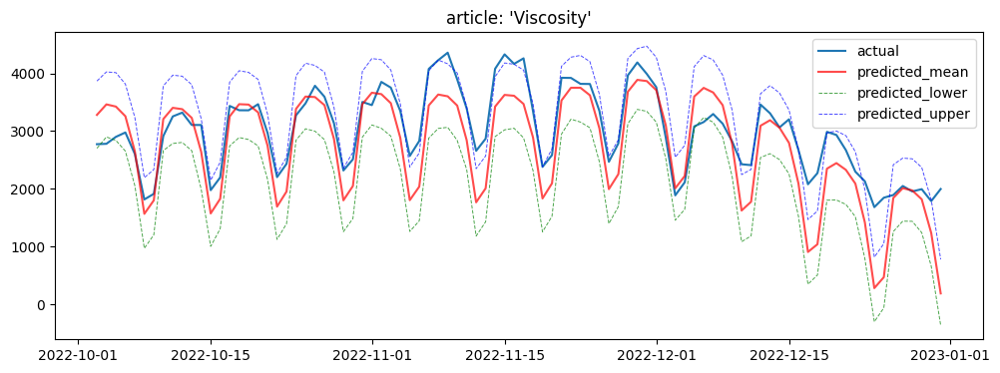

18:04:29 - cmdstanpy - INFO - Chain [1] start processing
18:04:29 - cmdstanpy - INFO - Chain [1] done processing


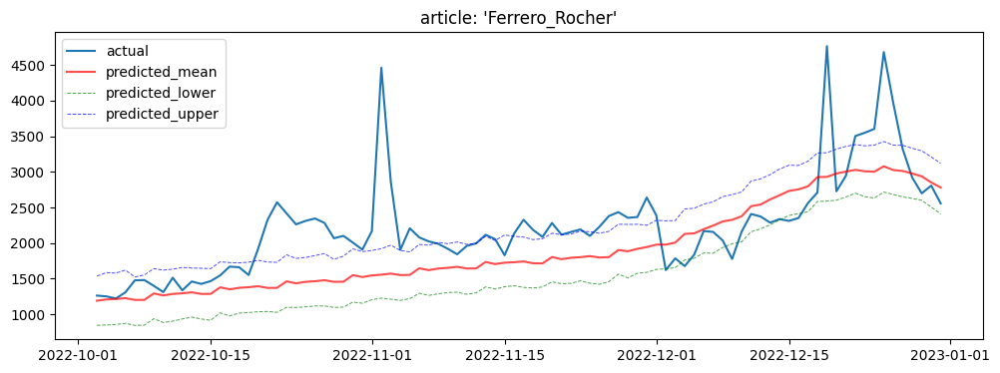

18:04:30 - cmdstanpy - INFO - Chain [1] start processing
18:04:30 - cmdstanpy - INFO - Chain [1] done processing


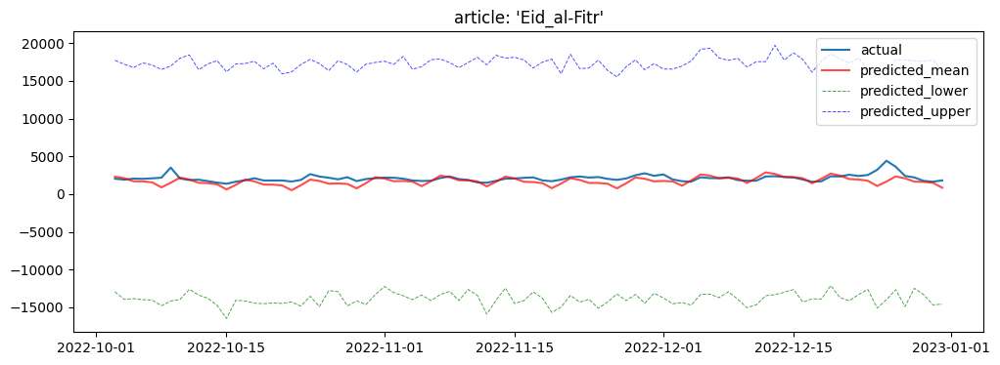

18:04:31 - cmdstanpy - INFO - Chain [1] start processing
18:04:32 - cmdstanpy - INFO - Chain [1] done processing


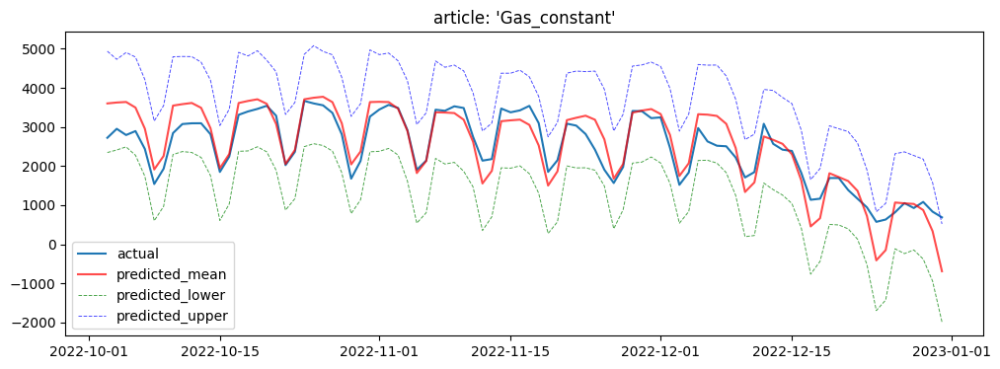

18:04:33 - cmdstanpy - INFO - Chain [1] start processing
18:04:33 - cmdstanpy - INFO - Chain [1] done processing


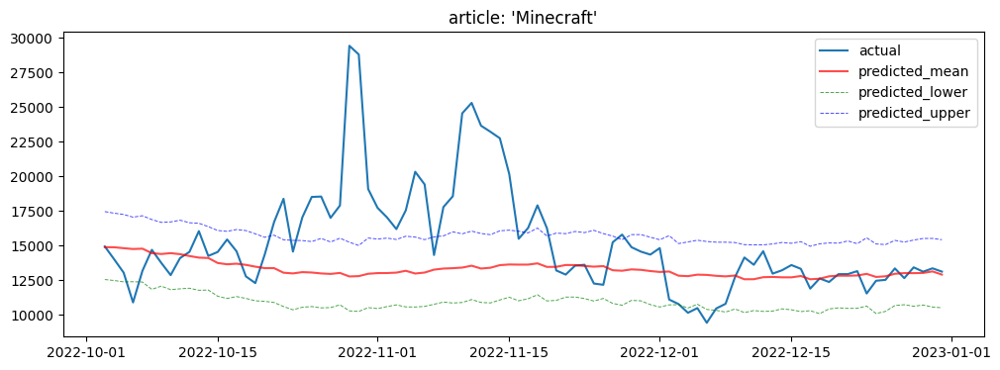

18:04:34 - cmdstanpy - INFO - Chain [1] start processing
18:04:34 - cmdstanpy - INFO - Chain [1] done processing


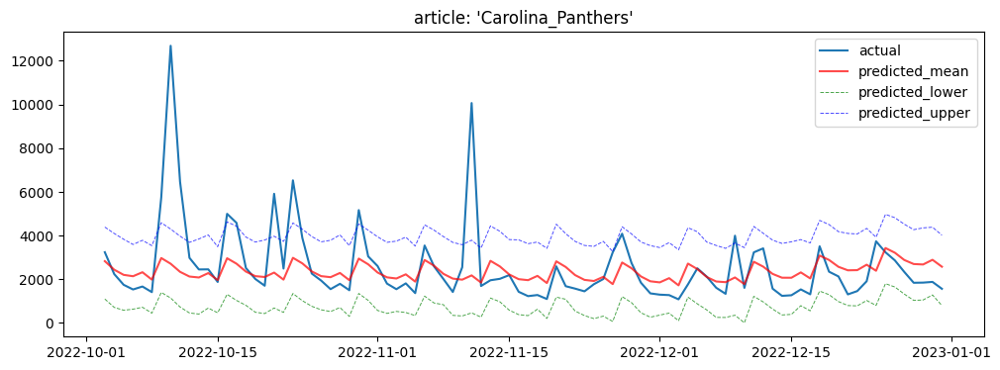

18:04:35 - cmdstanpy - INFO - Chain [1] start processing
18:04:35 - cmdstanpy - INFO - Chain [1] done processing


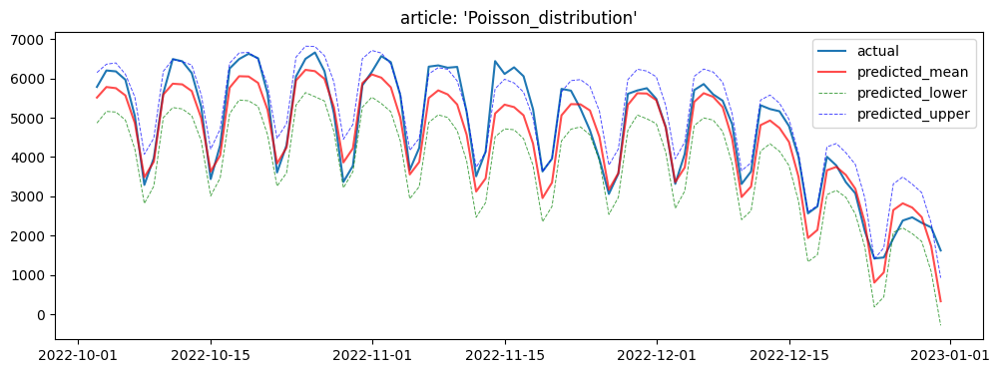

In [8]:
from sklearn.model_selection import train_test_split

size = 90
predictions_prophet = pd.DataFrame(columns = data.loc[articles[0]].index[-90:])

for i in articles:
    df = data.loc[i]
    df.rename(columns = {'visitors': 'y'}, inplace = True)
    df['ds'] = df.index

    train, test = train_test_split(df, test_size = size/len(df), shuffle = False)

    # We assume that all the time series in our dataset have yearly and weekly seasonality.
    model = Prophet(yearly_seasonality = True, weekly_seasonality = True, seasonality_prior_scale = 1)
    model.fit(train)

    future = model.make_future_dataframe(periods = size)

    forecast = model.predict(future)

    pred = forecast.iloc[-90:, :]

    predictions_prophet.loc[i] = pred['yhat'].values

    plt.figure(figsize = (12, 4))
    plt.title("article: '" + i + "'")
    plt.plot(test['ds'], test['y'])
    plt.plot(pred['ds'], pred['yhat'], color = 'red', alpha = 0.7)
    plt.plot(pred['ds'], pred['yhat_lower'], color = 'green', alpha = 0.7, linestyle='dashed', linewidth = 0.7)
    plt.plot(pred['ds'], pred['yhat_upper'], color = 'blue', alpha = 0.7, linestyle='dashed', linewidth = 0.7)
    plt.legend(['actual', 'predicted_mean', 'predicted_lower', 'predicted_upper'])
    plt.show()

In [9]:
for col in predictions_prophet.columns:
    predictions_prophet[col] = predictions_prophet[col].astype('int')
predictions_prophet.index.rename('article', inplace = True)
predictions_prophet.to_csv('predictions\predictions_prophet.csv')

# Predictions using Prophet
predictions_prophet

date,2022-10-03,2022-10-04,2022-10-05,2022-10-06,2022-10-07,2022-10-08,2022-10-09,2022-10-10,2022-10-11,2022-10-12,...,2022-12-22,2022-12-23,2022-12-24,2022-12-25,2022-12-26,2022-12-27,2022-12-28,2022-12-29,2022-12-30,2022-12-31
article,,,,,,,,,,,,,,,,,,,,,
Tarzan,1409,1302,1290,1281,1288,1553,1680,1429,1328,1320,...,1175,1193,1470,1609,1372,1284,1291,1299,1321,1600
De_Morgan's_laws,1737,1809,1795,1750,1536,1155,1231,1671,1746,1736,...,791,551,148,204,628,691,674,630,421,53
Los_Angeles,15362,15004,14911,15107,14627,14458,15299,15779,15485,15447,...,16280,15794,15619,16455,16932,16635,16596,16837,16391,16247
Thermography,348,359,354,342,295,222,239,351,364,360,...,252,201,126,141,251,263,258,249,204,134
Social_studies,812,839,813,788,681,576,598,724,758,739,...,527,424,323,350,481,521,508,499,409,320
Normal_distribution,8183,8522,8483,8188,7076,4894,5571,8306,8673,8666,...,4809,3486,1112,1616,4200,4439,4329,3989,2859,684
Buddhism,7216,7143,7041,6957,6329,5807,6700,7180,7135,7060,...,6004,5360,4826,5712,6189,6145,6078,6032,5445,4967
Adobe_Photoshop,4943,5046,5013,4934,4589,4081,4142,4974,5091,5071,...,4487,4118,3587,3630,4447,4552,4523,4452,4118,3622
Viscosity,3281,3463,3425,3258,2651,1567,1801,3209,3404,3380,...,2091,1419,281,469,1842,2011,1973,1819,1236,189


In [10]:
# MAE, RMSE, and MAPE for Prophet.

errors_prophet = evaluate_results(predictions_prophet)
errors_prophet

,mae,rmse,mape
Tarzan,339.411111,414.036217,0.195404
De_Morgan's_laws,144.744444,176.615307,0.141287
Los_Angeles,1599.655556,2538.759997,0.106722
Thermography,76.8,89.118523,0.206574
Social_studies,85.211111,100.462873,0.154816
Normal_distribution,446.133333,594.71063,0.080746
Buddhism,1113.533333,1462.719765,0.136516
Adobe_Photoshop,906.6,972.749003,0.253096
Viscosity,420.533333,537.051415,0.15734
Ferrero_Rocher,442.222222,607.966702,0.183613


<a id='comparison'></a>
### Comparison of Models

In [141]:
predictions_arima = pd.read_csv('predictions\predictions_arima.csv')
predictions_prophet = pd.read_csv('predictions\predictions_prophet.csv')
predictions_rnn = pd.read_csv('predictions\predictions_rnn.csv')

In [142]:
predictions_arima.set_index('article', inplace = True)
predictions_prophet.set_index('article', inplace = True)
predictions_rnn.set_index('article', inplace = True)

In [143]:
errors_arima = evaluate_results(predictions_arima)
errors_prophet = evaluate_results(predictions_prophet)
errors_rnn = evaluate_results(predictions_rnn)

In [144]:
mae = pd.DataFrame([errors_arima['mae'], errors_prophet['mae'], errors_rnn['mae']],
                   index = ['arima', 'prophet', 'rnn'])
mae = mae.T
mae.reset_index(inplace = True)
mae.rename(columns = {'index': 'article'}, inplace = True)
# Since the values of 'Eid_al-Fitr' are outliers, we drop that row.
mae.drop(10, inplace = True)
mae

,article,arima,prophet,rnn
0,Tarzan,221.844444,339.411111,220.677778
1,De_Morgan's_laws,233.277778,144.744444,362.333333
2,Los_Angeles,1779.411111,1599.655556,1539.200000
3,Thermography,60.677778,76.800000,50.455556
4,Social_studies,337.811111,85.211111,184.577778
5,Normal_distribution,1583.833333,446.133333,1026.811111
6,Buddhism,843.633333,1113.533333,1138.611111
7,Adobe_Photoshop,450.500000,906.600000,602.122222
8,Viscosity,517.644444,420.533333,560.700000
9,Ferrero_Rocher,896.966667,442.222222,637.333333


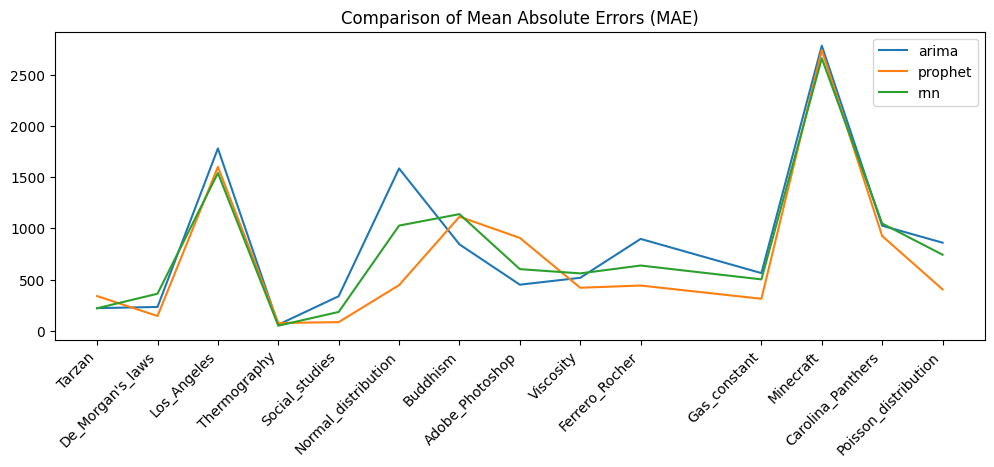

In [145]:
mae.plot(figsize = (12, 4))
plt.xticks(mae.index, mae['article'], rotation=45, ha='right')
plt.title('Comparison of Mean Absolute Errors (MAE)')
plt.show()

In [146]:
rmse = pd.DataFrame([errors_arima['rmse'], errors_prophet['rmse'], errors_rnn['rmse']],
                   index = ['arima', 'prophet', 'rnn'])
rmse = rmse.T
rmse.reset_index(inplace = True)
rmse.rename(columns = {'index': 'article'}, inplace = True)
rmse.drop(10, inplace = True)
rmse

,article,arima,prophet,rnn
0,Tarzan,293.145963,414.036217,294.072950
1,De_Morgan's_laws,333.125285,176.615307,404.766572
2,Los_Angeles,2640.587883,2538.759997,2465.768377
3,Thermography,75.267449,89.118523,64.816922
4,Social_studies,379.904973,100.462873,216.139770
5,Normal_distribution,1867.623686,594.710630,1249.267301
6,Buddhism,1213.067851,1462.719765,1475.401508
7,Adobe_Photoshop,590.638026,972.749003,681.197891
8,Viscosity,634.901970,537.051415,704.960432
9,Ferrero_Rocher,1129.114338,607.966702,808.014810


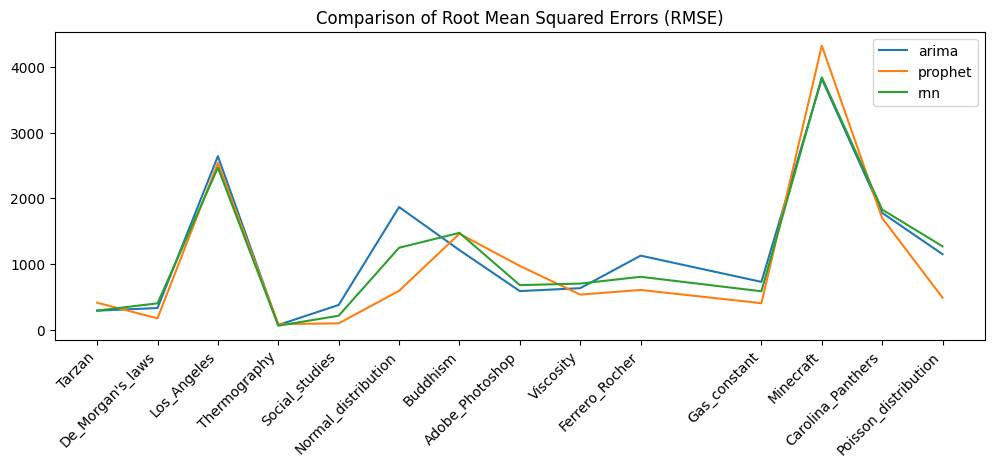

In [147]:
rmse.plot(figsize = (12, 4))
plt.xticks(rmse.index, rmse['article'], rotation=45, ha='right')
plt.title('Comparison of Root Mean Squared Errors (RMSE)')
plt.show()

In [148]:
mape = pd.DataFrame([errors_arima['mape'], errors_prophet['mape'], errors_rnn['mape']],
                   index = ['arima', 'prophet', 'rnn'])
mape = mape.T
mape.reset_index(inplace = True)
mape.rename(columns = {'index': 'article'}, inplace = True)
mape.drop(10, inplace = True)
mape

,article,arima,prophet,rnn
0,Tarzan,0.145125,0.195404,0.128806
1,De_Morgan's_laws,0.279850,0.141287,0.304283
2,Los_Angeles,0.120628,0.106722,0.100127
3,Thermography,0.159012,0.206574,0.148544
4,Social_studies,0.674570,0.154816,0.329745
5,Normal_distribution,0.288412,0.080746,0.166678
6,Buddhism,0.104527,0.136516,0.140793
7,Adobe_Photoshop,0.131184,0.253096,0.161501
8,Viscosity,0.170443,0.157340,0.207487
9,Ferrero_Rocher,0.353014,0.183613,0.263311


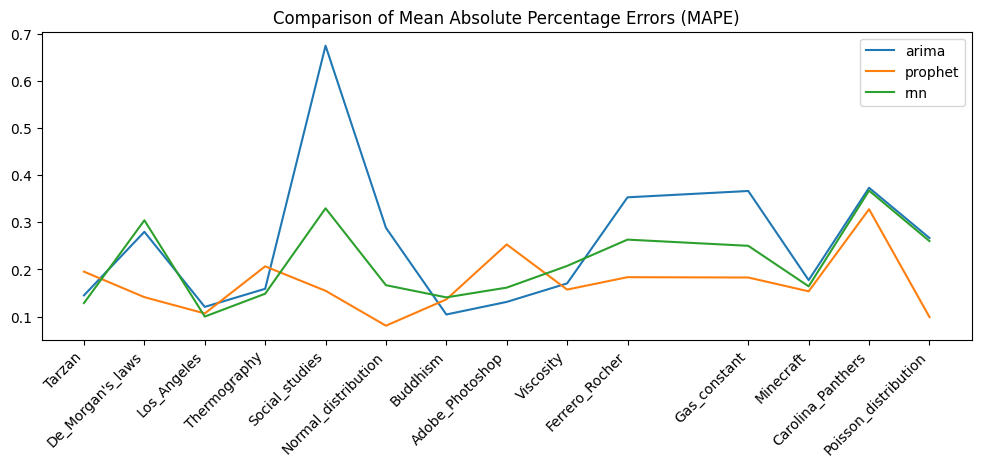

In [149]:
mape.plot(figsize = (12, 4))
plt.xticks(mape.index, mape['article'], rotation=45, ha='right')
plt.title('Comparison of Mean Absolute Percentage Errors (MAPE)')
plt.show()

<br>
<font size="20">🐣</font>

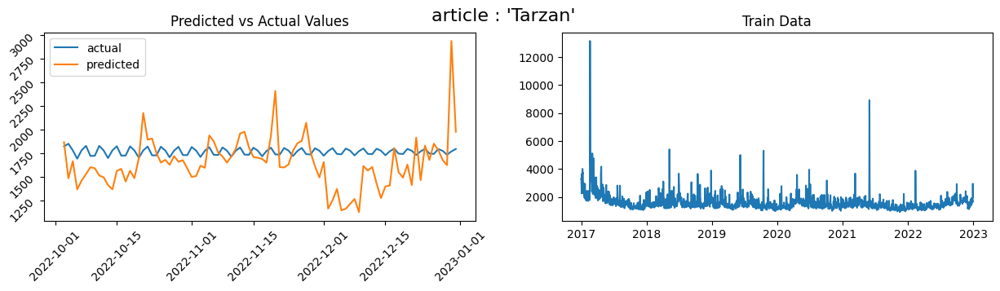

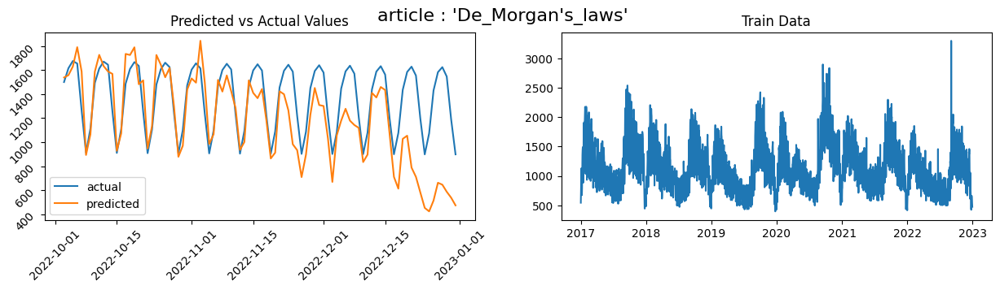

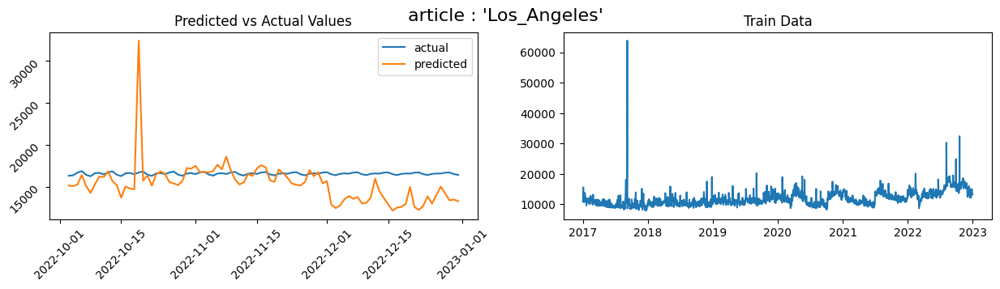

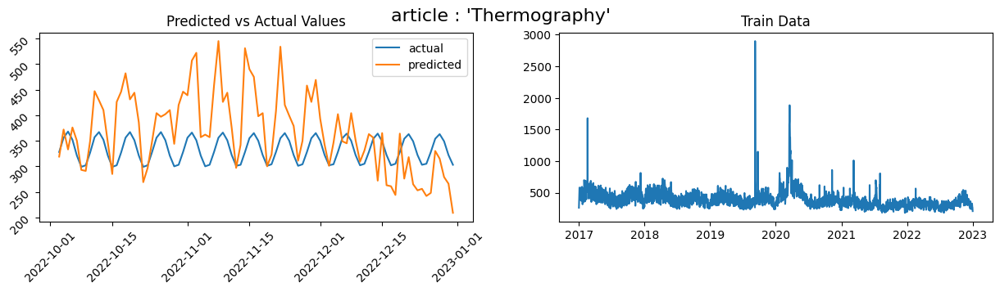

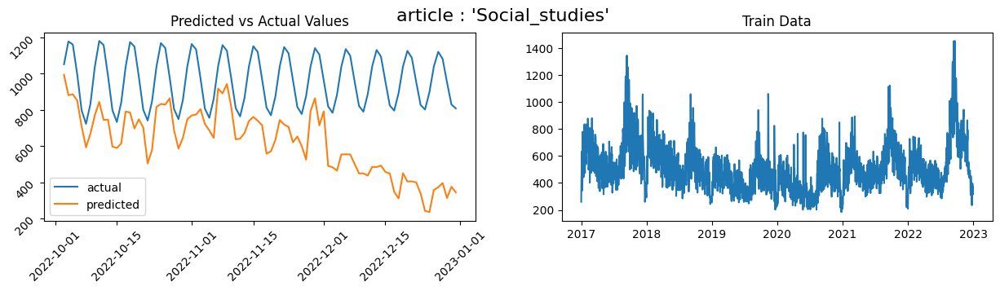

...

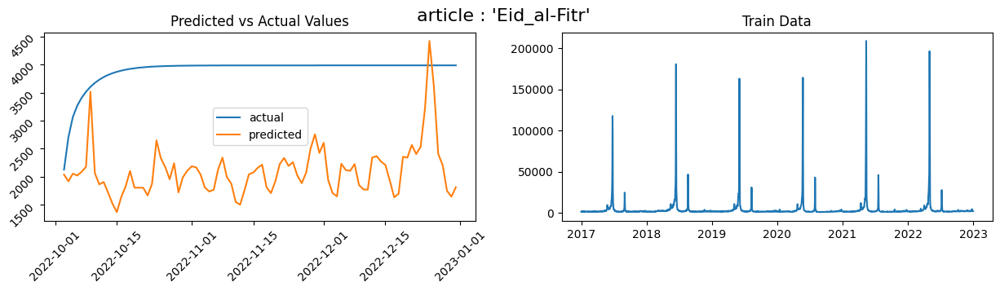

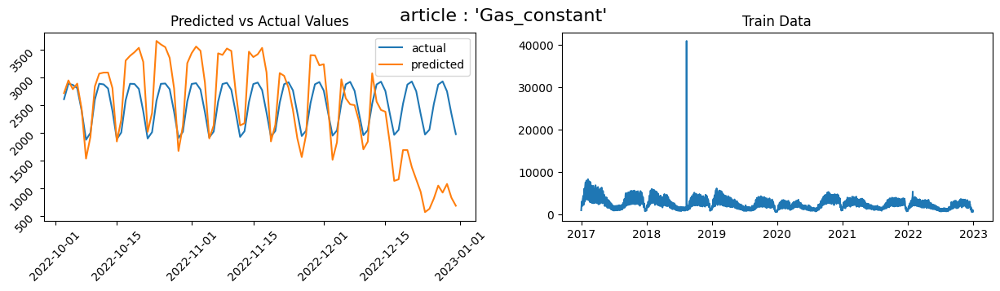

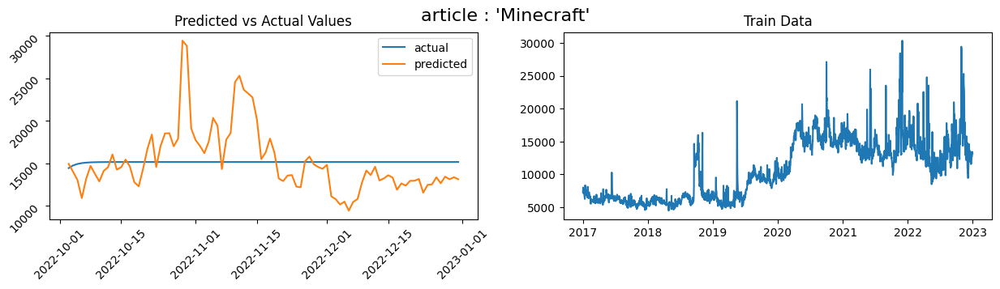

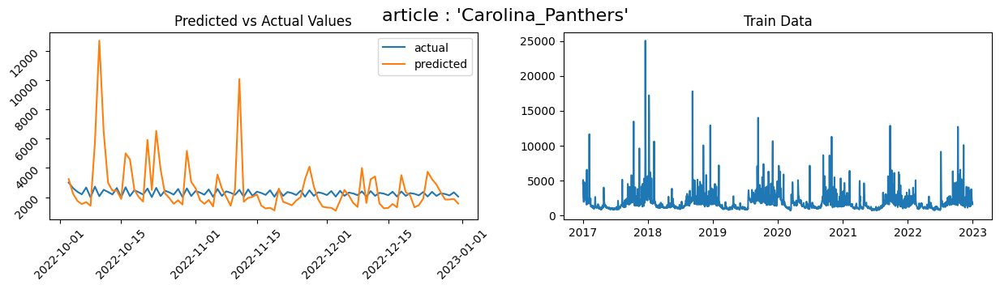

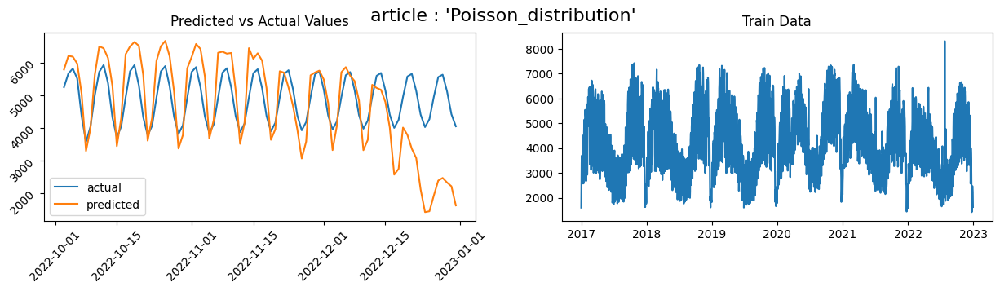

In [236]:
for i in articles:
    df = data.loc[i]
    result_df = predictions_arima.loc[i]
    fig, ax = plt.subplots(1, 2, figsize=(15,3), gridspec_kw={'width_ratios': [1, 1]})
    fig.suptitle("article : '" + i + "'", fontsize = 16)

    ax[0].plot(result_df.index, result_df.values, label = 'actual')
    ax[0].plot(result_df.index, df['visitors'][-90:], label = 'predicted')
    ax[0].legend()
    ax[0].title.set_text('Predicted vs Actual Values')
    ax[0].tick_params(rotation = 45)
    ax[1].plot(df)
    ax[1].title.set_text('Train Data')

    plt.show()

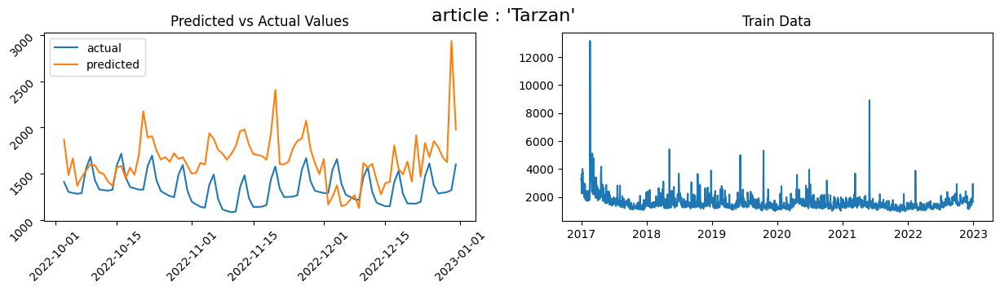

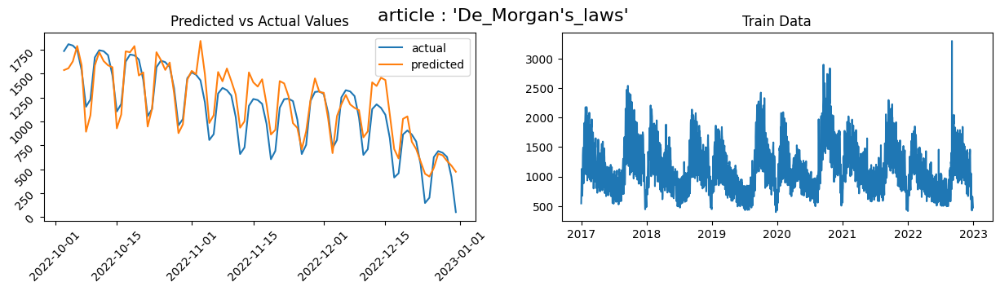

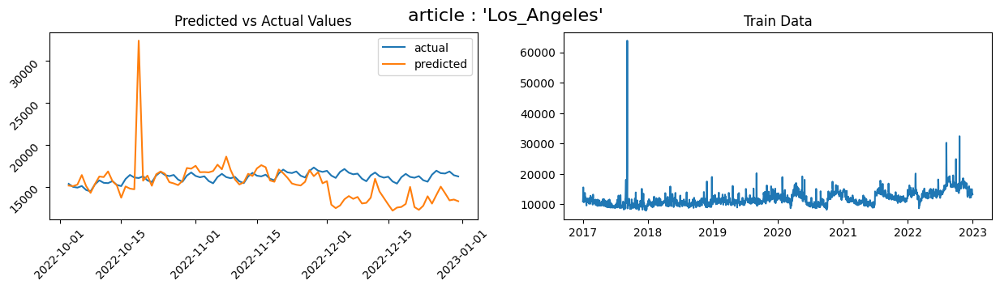

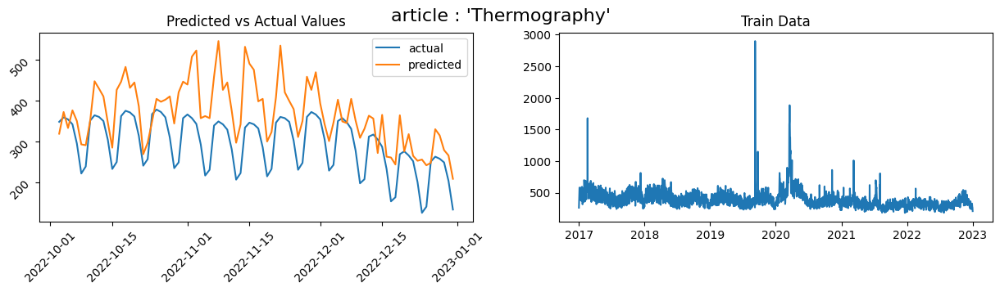

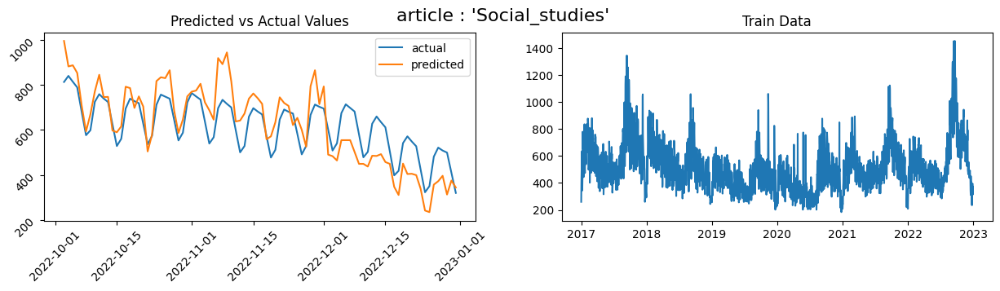

...

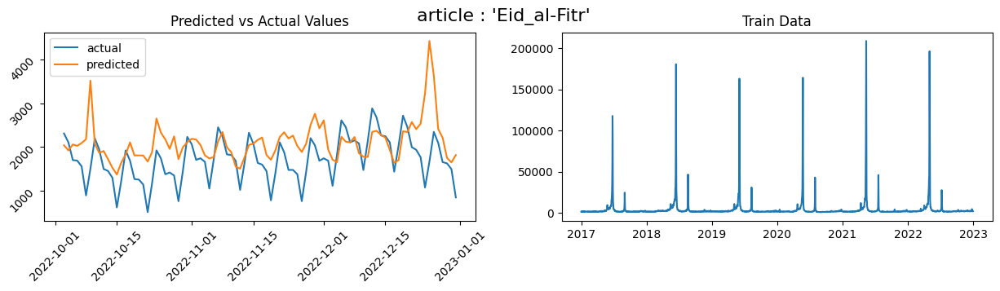

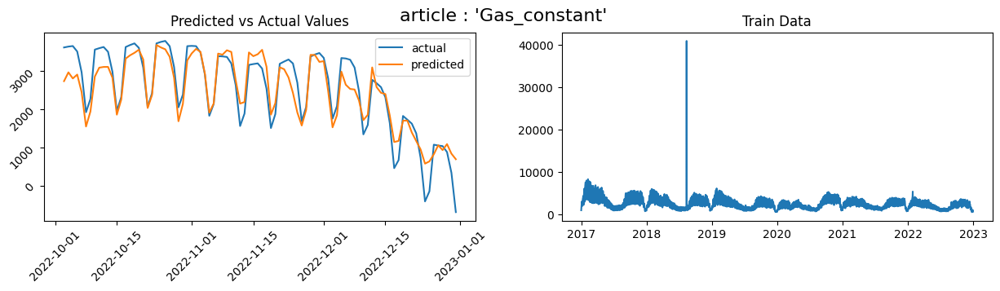

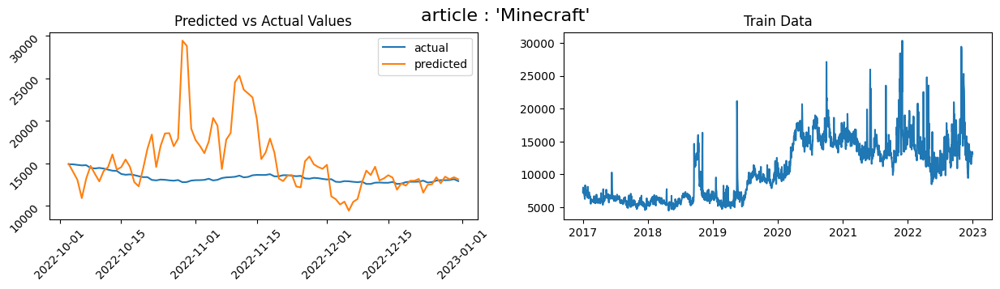

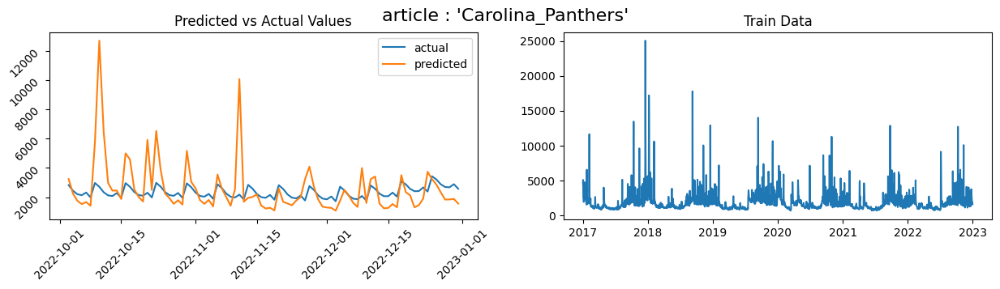

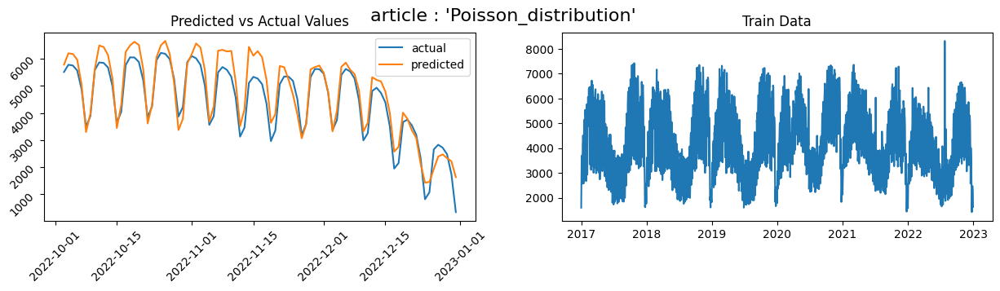

In [237]:
for i in articles:
    df = data.loc[i]
    result_df = predictions_prophet.loc[i]
    fig, ax = plt.subplots(1, 2, figsize=(15,3), gridspec_kw={'width_ratios': [1, 1]})
    fig.suptitle("article : '" + i + "'", fontsize = 16)

    ax[0].plot(result_df.index, result_df.values, label = 'actual')
    ax[0].plot(result_df.index, df['visitors'][-90:], label = 'predicted')
    ax[0].legend()
    ax[0].title.set_text('Predicted vs Actual Values')
    ax[0].tick_params(rotation = 45)
    ax[1].plot(df)
    ax[1].title.set_text('Train Data')

    plt.show()

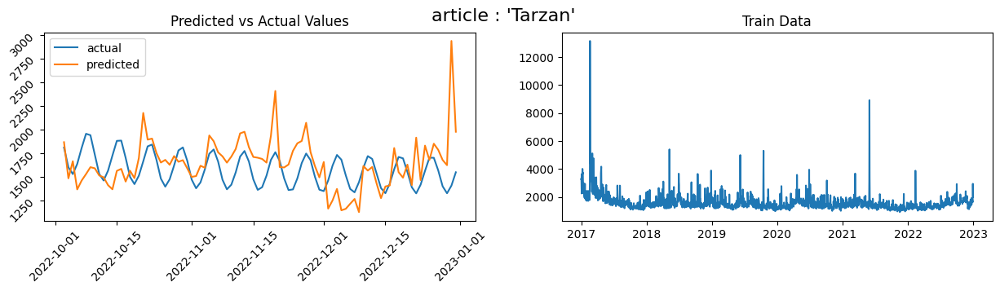

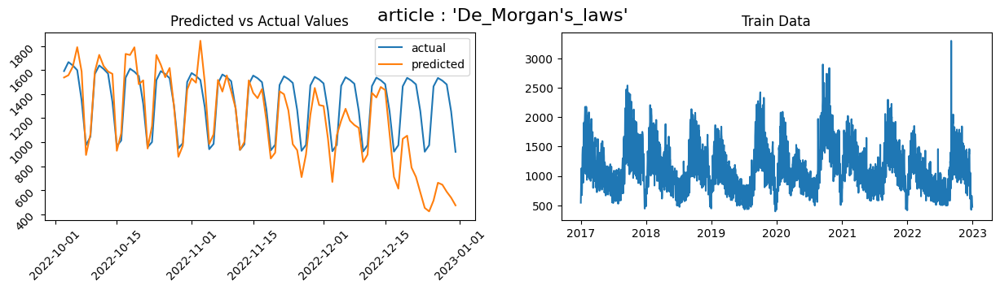

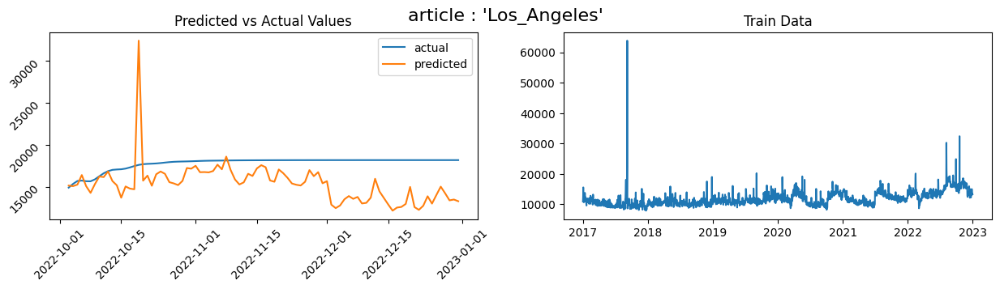

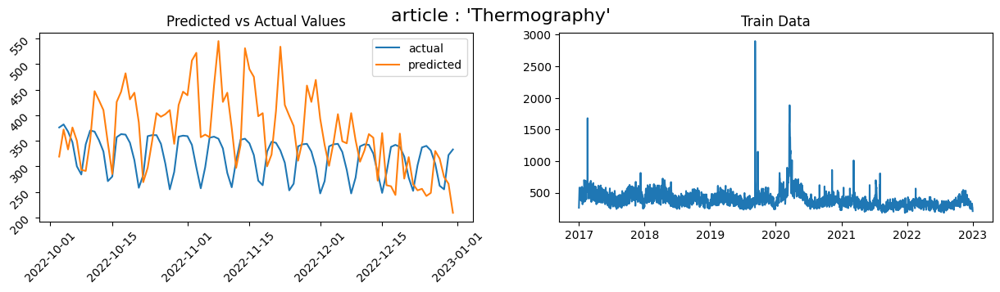

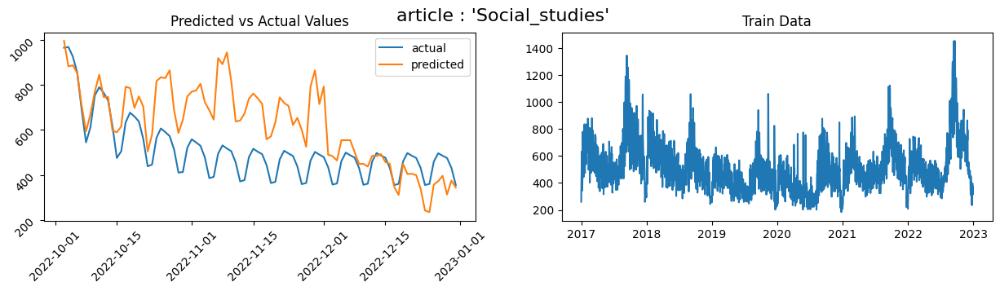

...

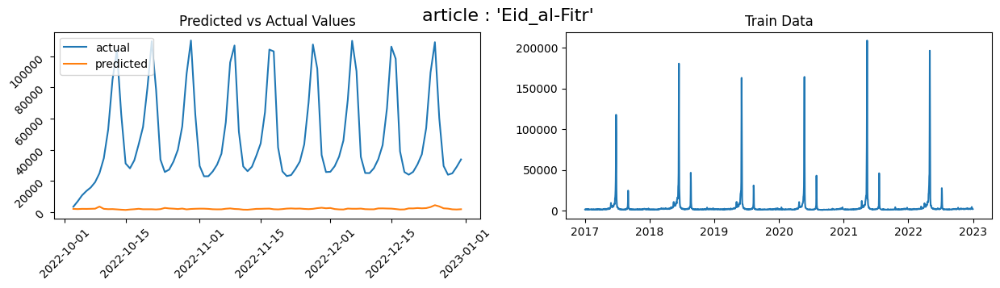

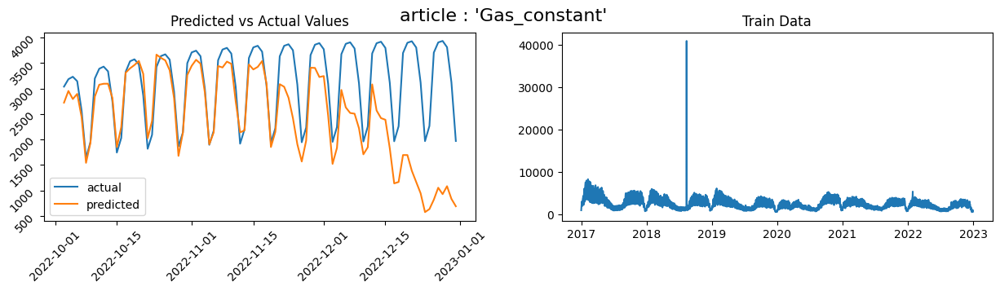

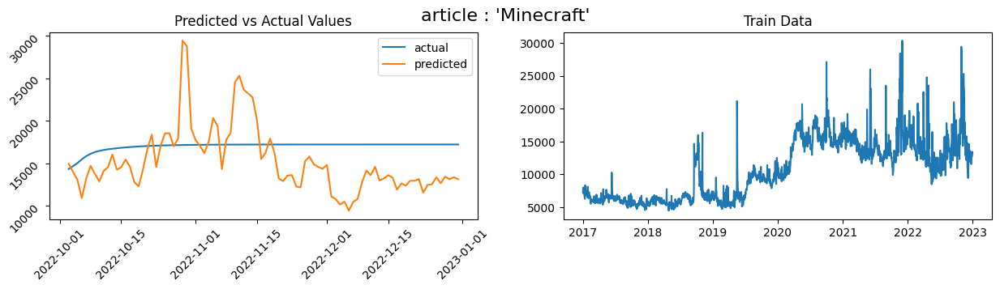

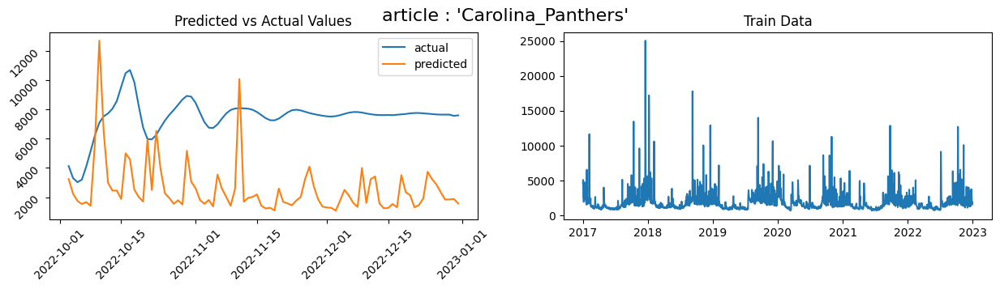

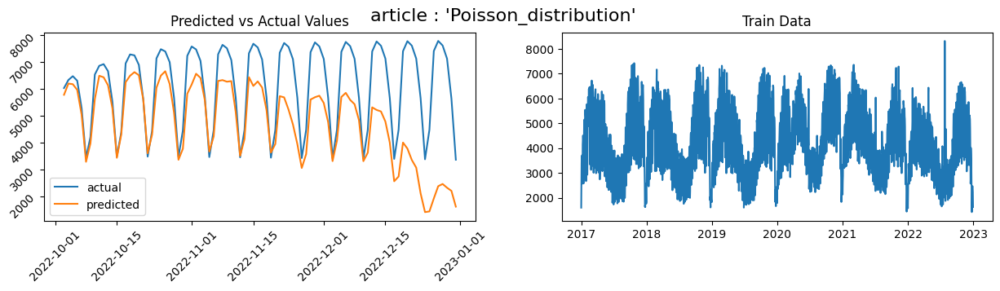

In [238]:
for i in articles:
    df = data.loc[i]
    result_df = predictions_rnn.loc[i]
    fig, ax = plt.subplots(1, 2, figsize=(15,3), gridspec_kw={'width_ratios': [1, 1]})
    fig.suptitle("article : '" + i + "'", fontsize = 16)

    ax[0].plot(result_df.index, result_df.values, label = 'actual')
    ax[0].plot(result_df.index, df['visitors'][-90:], label = 'predicted')
    ax[0].legend()
    ax[0].title.set_text('Predicted vs Actual Values')
    ax[0].tick_params(rotation = 45)
    ax[1].plot(df)
    ax[1].title.set_text('Train Data')

    plt.show()